In [1]:
from soview import *
import pandas as pd

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.1 python-igraph==0.9.8 pynndescent==0.5.5
squidpy==1.1.2


In [2]:
seqfish_path = '/aaa/jianhuayao/project2/zhiyuanyuan/PUBDT/st/seqfish'
h5ad_path = f'{seqfish_path}/TBD'

In [3]:
seqfish_raw_file1 = f'{seqfish_path}/hippo_raw/seqFISH_cellxgene_with_anatomy.csv'

In [4]:
df_count = pd.read_csv(seqfish_raw_file1)

In [8]:
df_count

,Unnamed: 0,9330158h04rik,A330009n23rik,A830009l08rik,Ackr2,Acsl5,Adamts13,Adamts17,Adamts19,Adamts2,...,pdlim5,plekhb2,neurod1,serpinb8,x_region_microns,y_region_microns,area_sq_microns,region_id,layer,depth_um
0,0,5,1,1,0,1,13,1,3,2,...,3,30,14,38,473.248943,167.001378,12391.078316,11,VISp_II/III,172.602054
1,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,471.057756,44.945062,3199.731679,16,VISp_I,59.936874
2,2,7,1,7,1,4,17,8,3,3,...,7,119,42,81,477.008603,144.742918,21133.881156,21,VISp_II/III,153.726199
3,3,3,0,0,0,0,4,0,0,0,...,4,14,4,3,476.048387,233.160143,3989.043546,22,VISp_II/III,234.317642
4,4,0,0,0,0,1,0,0,0,0,...,18,7,0,2,477.841801,44.522368,6885.124937,23,VISp_I,62.273670
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2724,2724,0,0,0,0,1,2,0,0,2,...,0,4,0,2,230.293889,1534.252216,9271.395830,7198,outside_VISp,1327.248860
2725,2725,0,0,0,0,0,0,0,0,1,...,5,13,10,0,231.596124,1741.556136,6047.962435,7199,outside_VISp,1517.631198
2726,2726,0,0,0,0,0,0,0,0,0,...,2,1,1,0,232.252504,1706.193126,4994.354072,7201,outside_VISp,1485.507504
2727,2727,0,0,0,0,0,1,0,0,0,...,3,0,2,0,232.851768,1731.739219,2978.366594,7203,outside_VISp,1509.144530


In [32]:
adata = ad.AnnData(X = df_count.values[:,1:-6].astype('int'))
adata.var_names = df_count.columns[1:-6]

/tmp/ipykernel_20401/1031411394.py:1: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = ad.AnnData(X = df_count.values[:,1:-6].astype('int'))


In [33]:
adata.obsm['spatial'] = df_count.values[:,-6:-4].astype('float')
adata.obs['area_sq_microns'] = df_count.values[:,-4].astype('float')
adata.obs['region_id'] = df_count.values[:,-3].astype('int')
adata.obs['layer'] = df_count.values[:,-2].astype('str')
adata.obs['depth'] = df_count.values[:,-1].astype('float')

In [34]:
adata.X

array([[  5.,   1.,   1., ...,  30.,  14.,  38.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  7.,   1.,   7., ..., 119.,  42.,  81.],
       ...,
       [  0.,   0.,   0., ...,   1.,   1.,   0.],
       [  0.,   0.,   0., ...,   0.,   2.,   0.],
       [  0.,   0.,   0., ...,   2.,   0.,   0.]], dtype=float32)

In [30]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
# if adata.shape[1]>=2000:
#     sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
# else:
#     pass


sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)

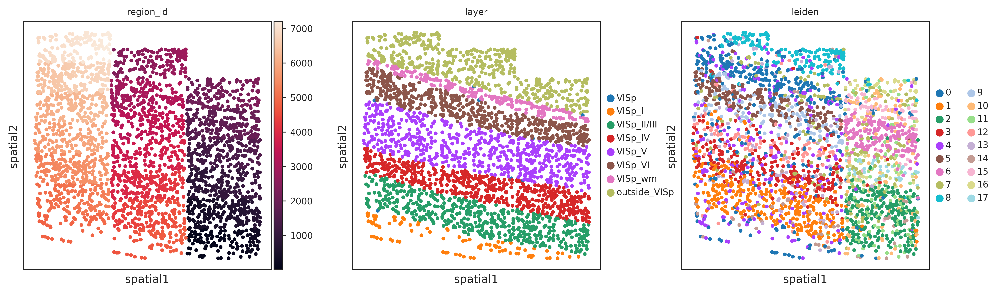

In [31]:
sc.pl.embedding(adata,basis='spatial',color=['region_id','layer','leiden'])

In [35]:
adata

AnnData object with n_obs × n_vars = 2729 × 630
    obs: 'area_sq_microns', 'region_id', 'layer', 'depth'
    obsm: 'spatial'

In [12]:
df_count.columns[1:-6].shape

(630,)

In [33]:
adata.obs['fov'] = df_fov.values[0,:]

In [39]:
df_spatial.values[:,:2]

array([[490, 760],
       [ 98, 532],
       [872, 570],
       ...,
       [609, 179],
       [756,  35],
       [693,  68]])

In [40]:
adata.obsm['spatial_3d'] = df_spatial.values
adata.obsm['spatial'] = df_spatial.values[:,:2]

In [42]:
for fov in np.unique(adata.obs['fov']):
    cur_ad = adata[adata.obs['fov']==fov]
    cur_ad.write_h5ad(f'{h5ad_path}/hippo_fov{fov}.h5ad')

The new directory is created!
[[ 3. 11. 13. ... 27.  7. 28.]
 [ 3.  9. 14. ... 22. 11. 20.]
 [12.  3.  1. ... 28. 16. 25.]
 ...
 [12. 13.  4. ... 14.  0. 13.]
 [ 4.  8.  3. ... 10.  3. 14.]
 [ 1.  0.  0. ...  5.  3.  6.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/data.h5ad


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


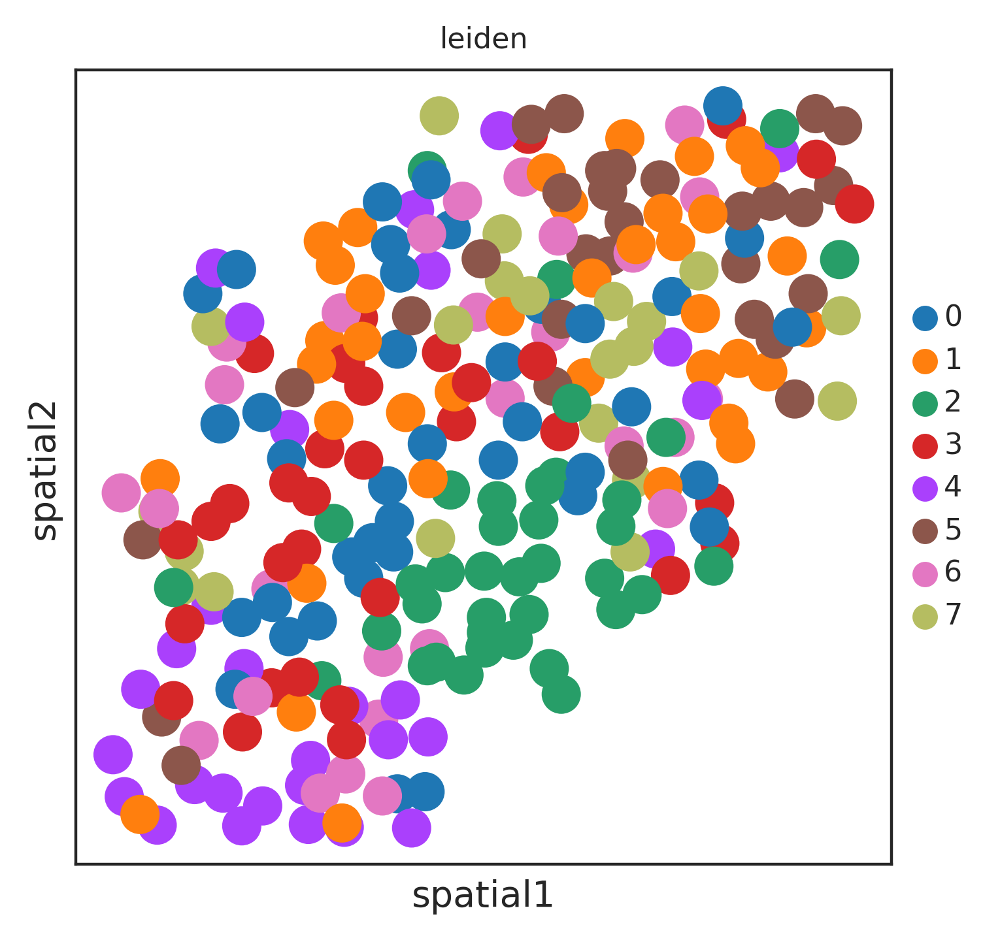

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


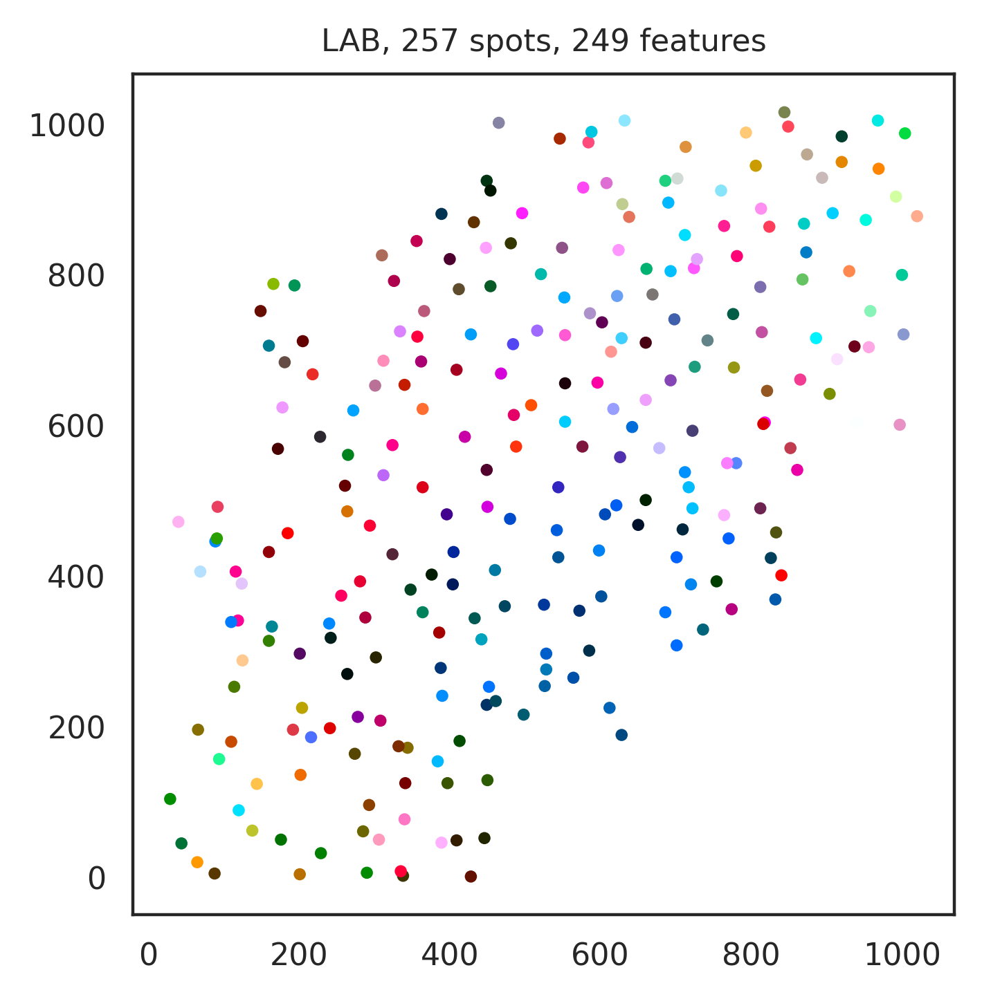

1.0 0.0


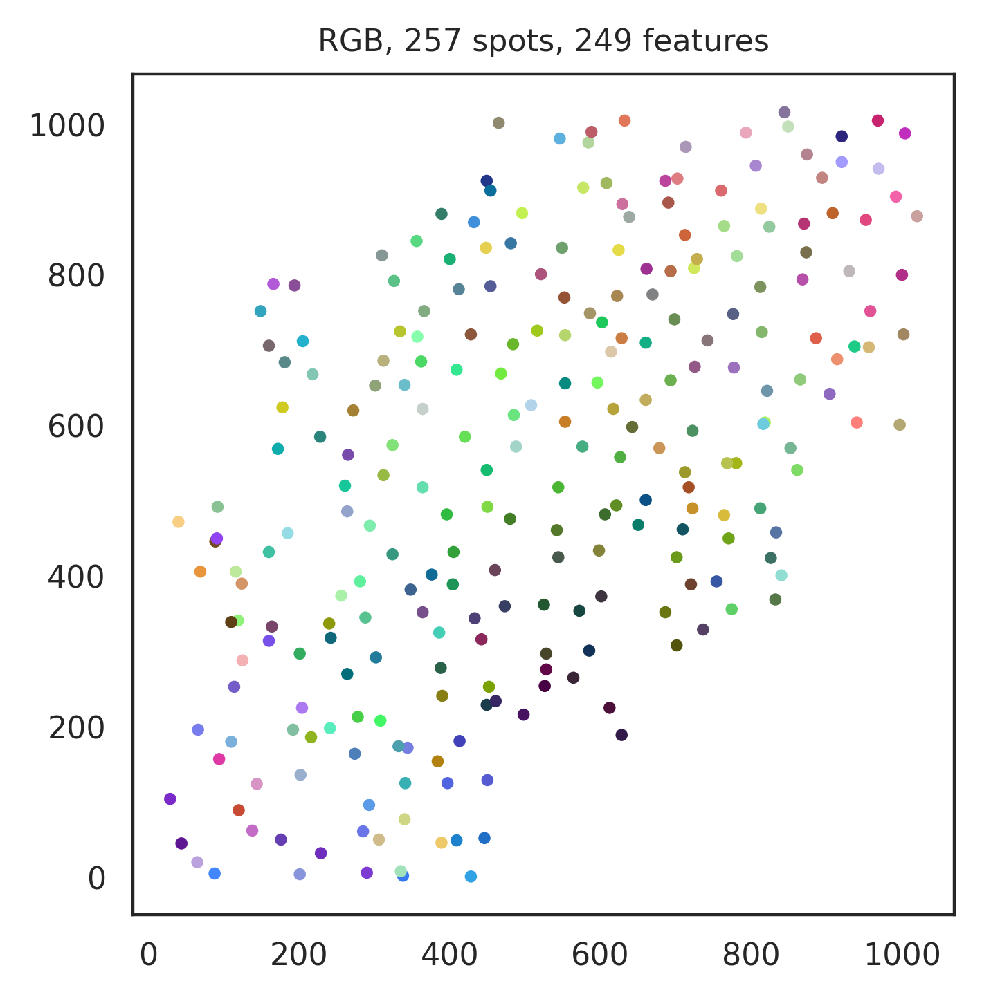

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/feature_dict.pickle
hippo_fov43
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/feature_dict.pickle
N_Unit: 257
N_Gene: 249
The new directory is created!
[[10. 14.  4. ... 38.  6. 49.]
 [ 7. 12. 18. ... 22.  7. 23.]
 [14.  4. 10. ... 12.  5. 26.]
 ...
 [ 1.  0.  4. ... 13.  7. 12.]
 [ 4.  0.  2. ...  1.  0.  3.]
 [12.  9. 14. ... 17.  3. 15.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/data.h5ad


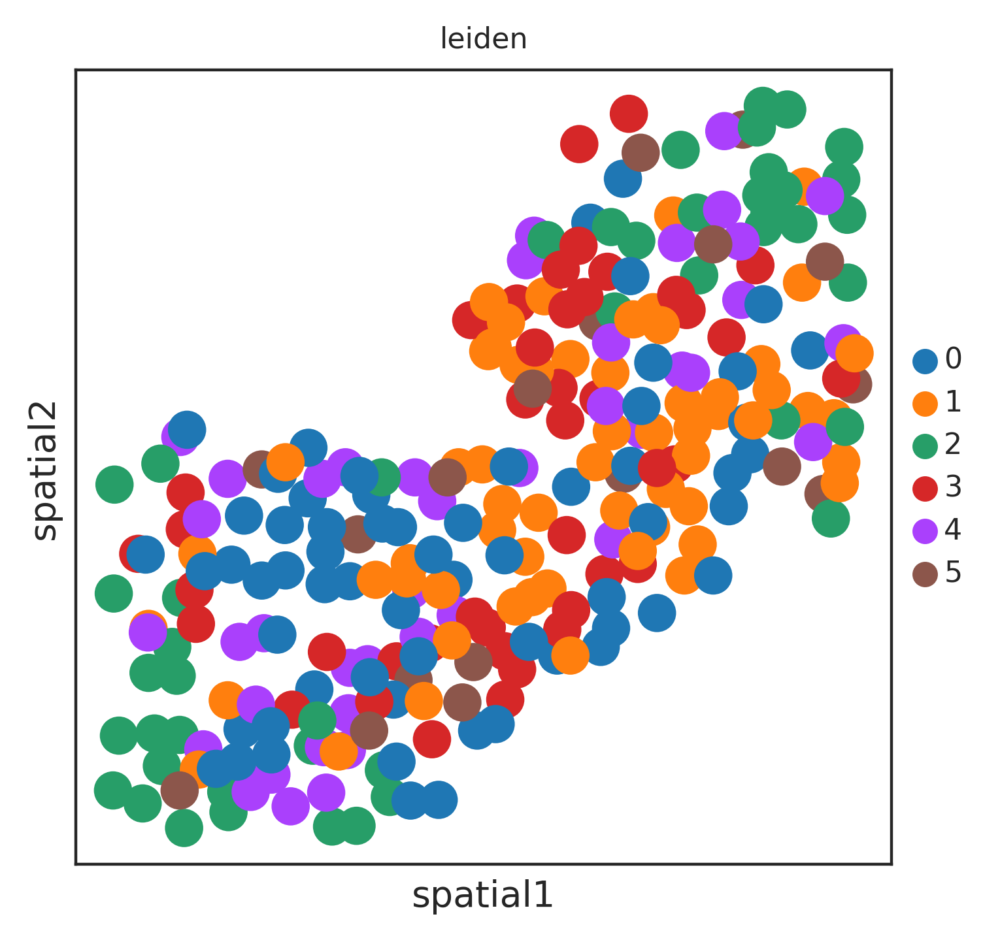

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 25 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


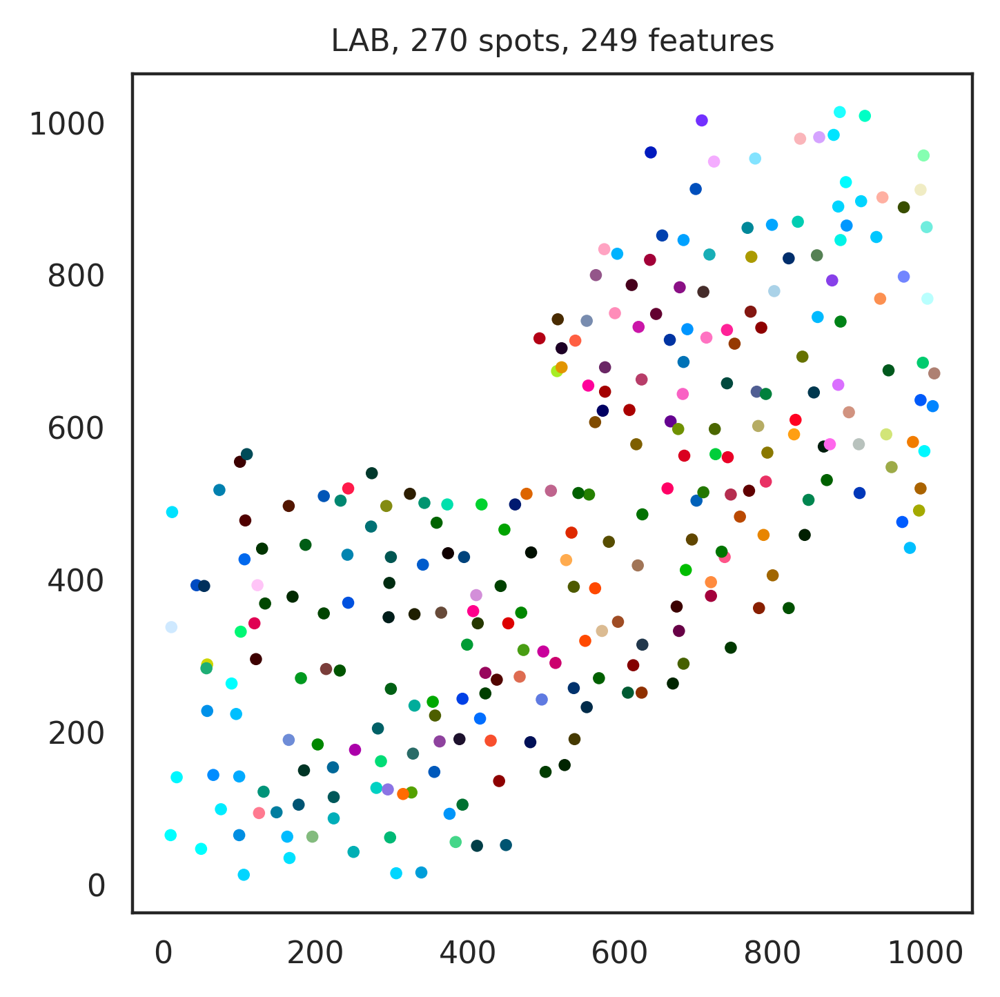

1.0 0.0


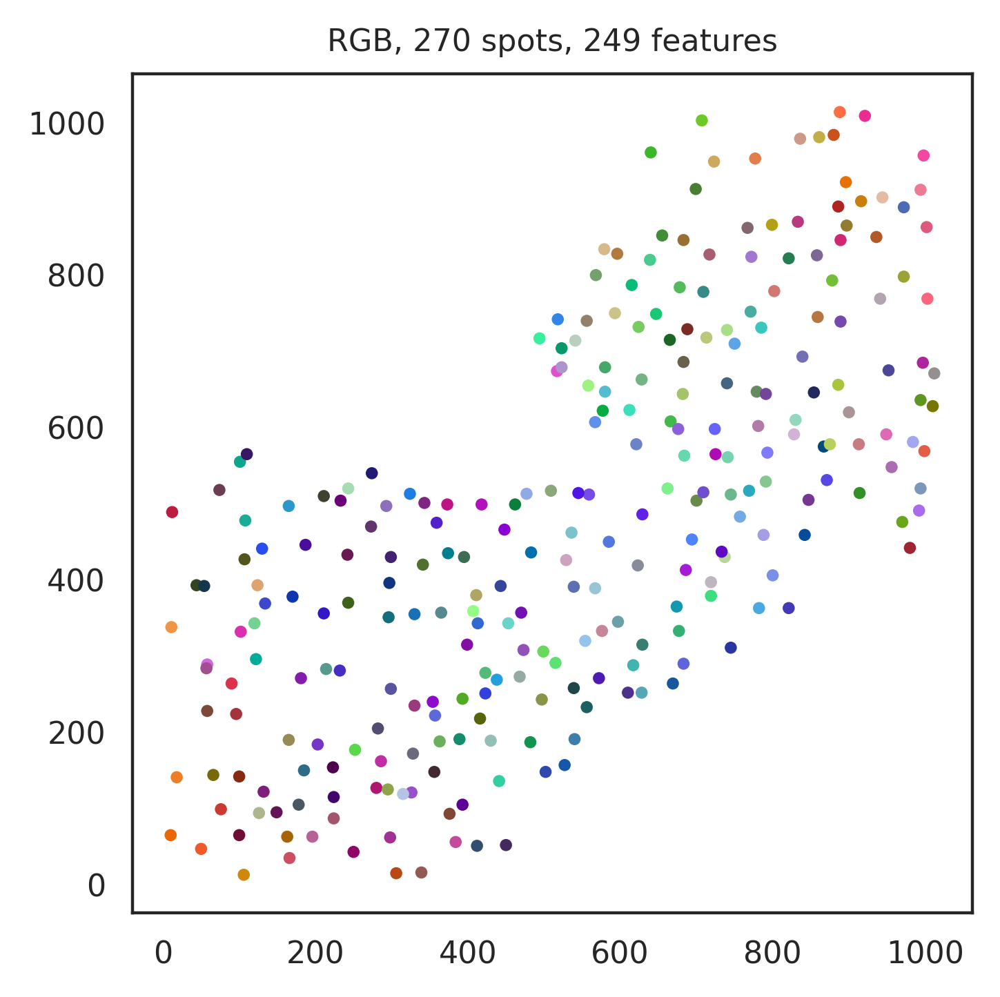

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/feature_dict.pickle
hippo_fov44
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/feature_dict.pickle
N_Unit: 270
N_Gene: 249
The new directory is created!
[[15.  3.  1. ...  7.  7. 11.]
 [18.  8. 13. ...  7.  3. 15.]
 [ 9. 13. 11. ... 14.  6. 19.]
 ...
 [13. 10. 18. ... 10.  1. 28.]
 [42. 23. 39. ... 27.  4. 48.]
 [ 5.  6.  7. ...  2.  7. 17.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/data.h5ad


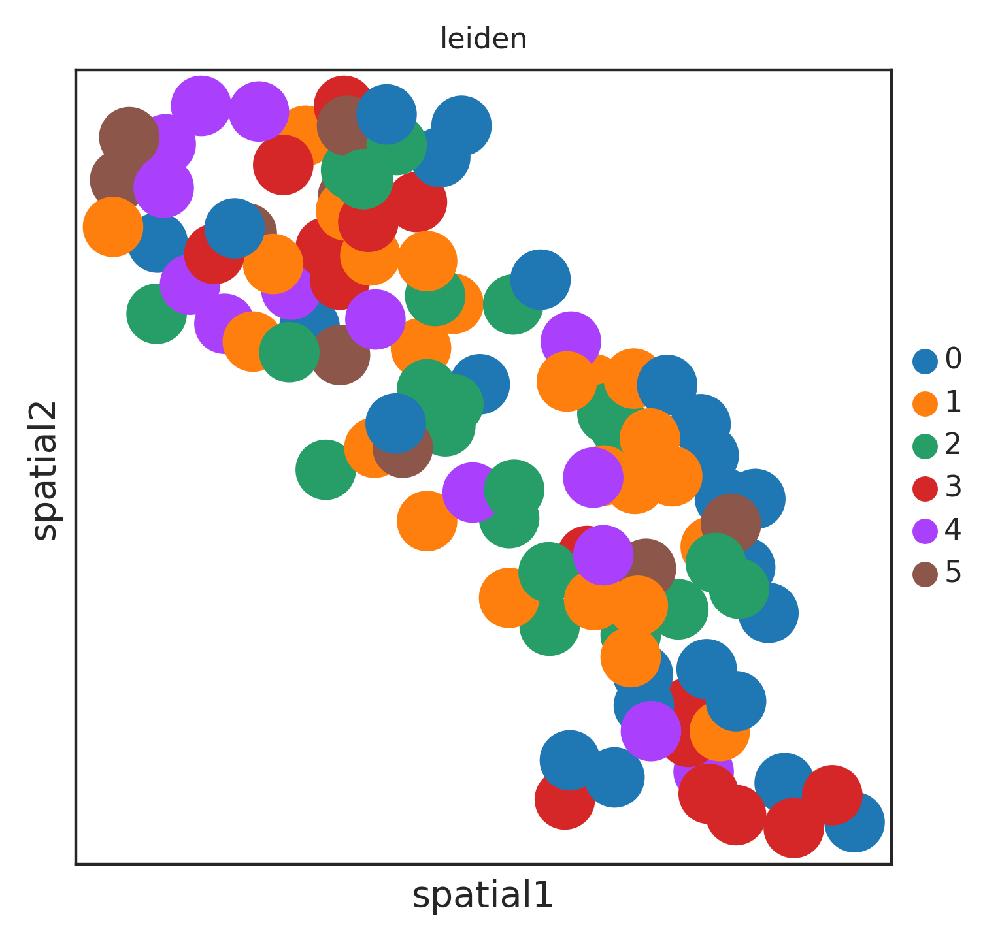

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


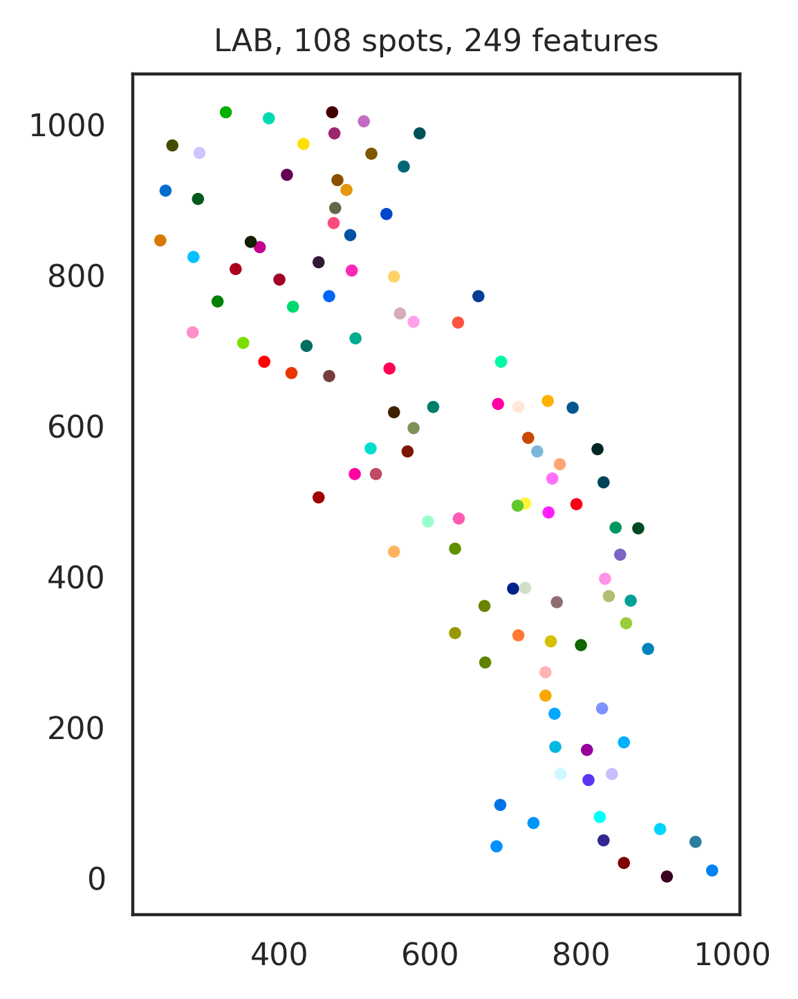

1.0 0.0


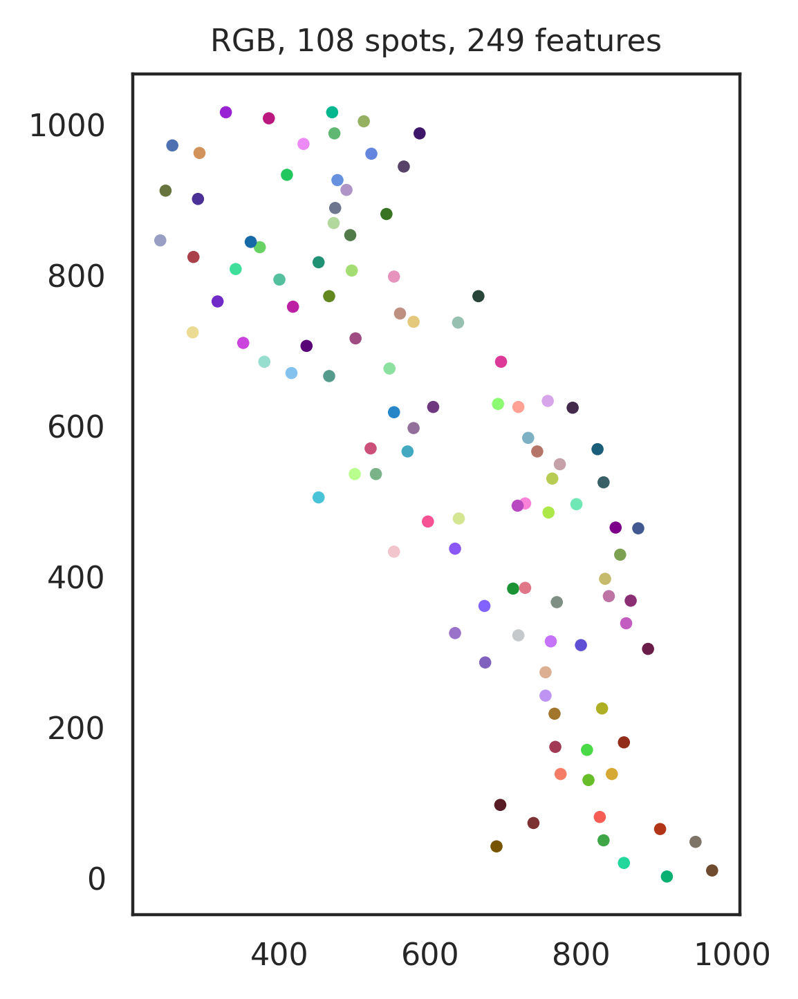

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/feature_dict.pickle
hippo_fov36
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/feature_dict.pickle
N_Unit: 108
N_Gene: 249
The new directory is created!
[[16.  5. 26. ... 27.  1. 45.]
 [15.  7. 10. ... 22.  1. 38.]
 [ 3.  4.  7. ... 24.  1. 36.]
 ...
 [29. 10. 13. ... 16.  1. 34.]
 [15.  1. 10. ...  6.  0. 17.]
 [23. 24. 16. ... 29.  9. 64.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/data.h5ad


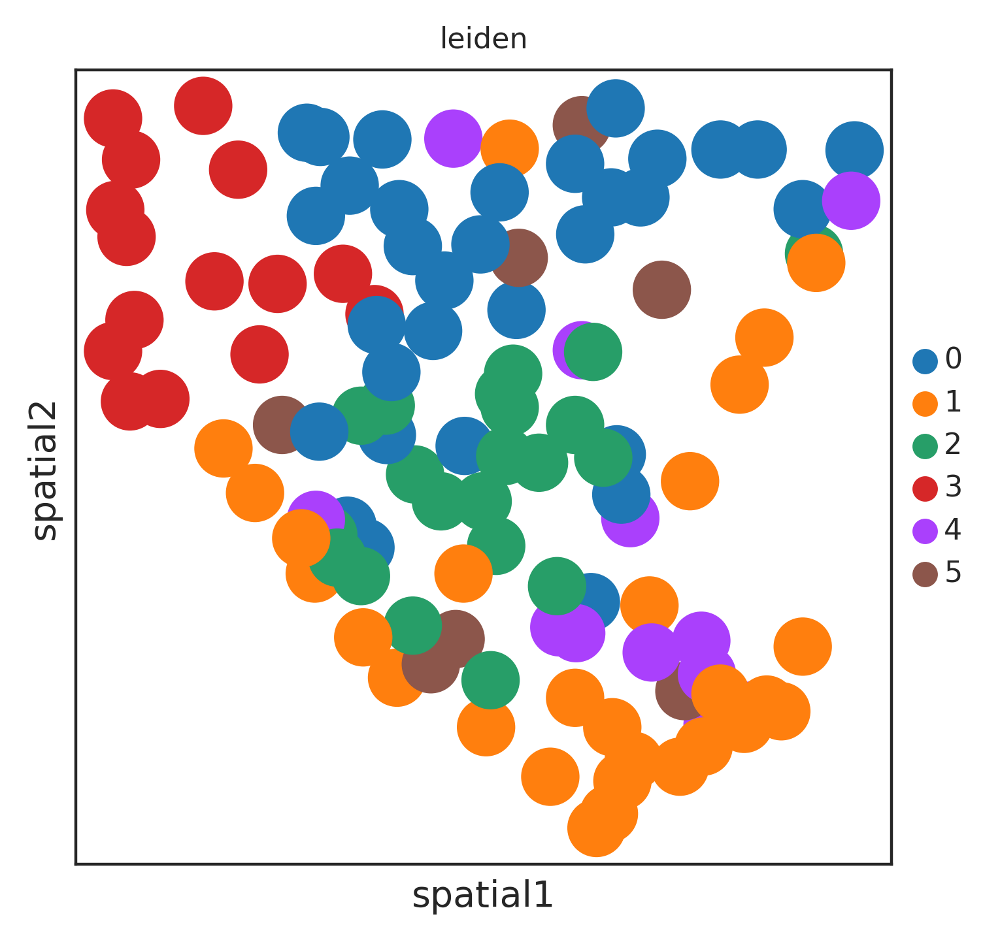

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 10 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


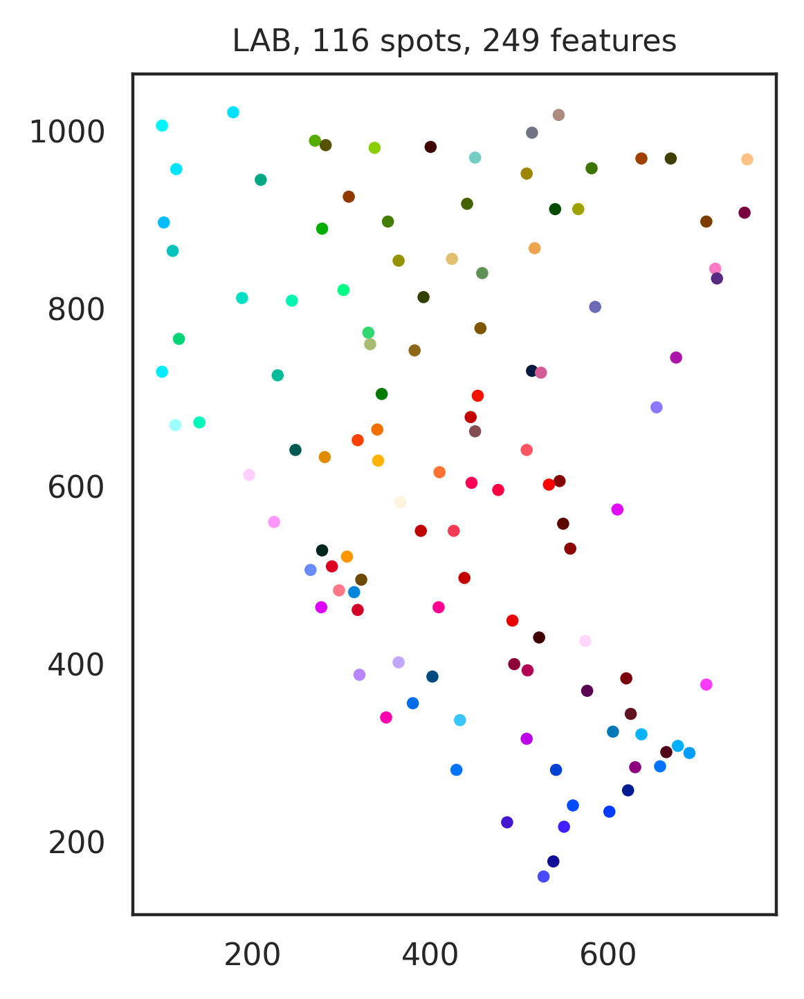

1.0 0.0


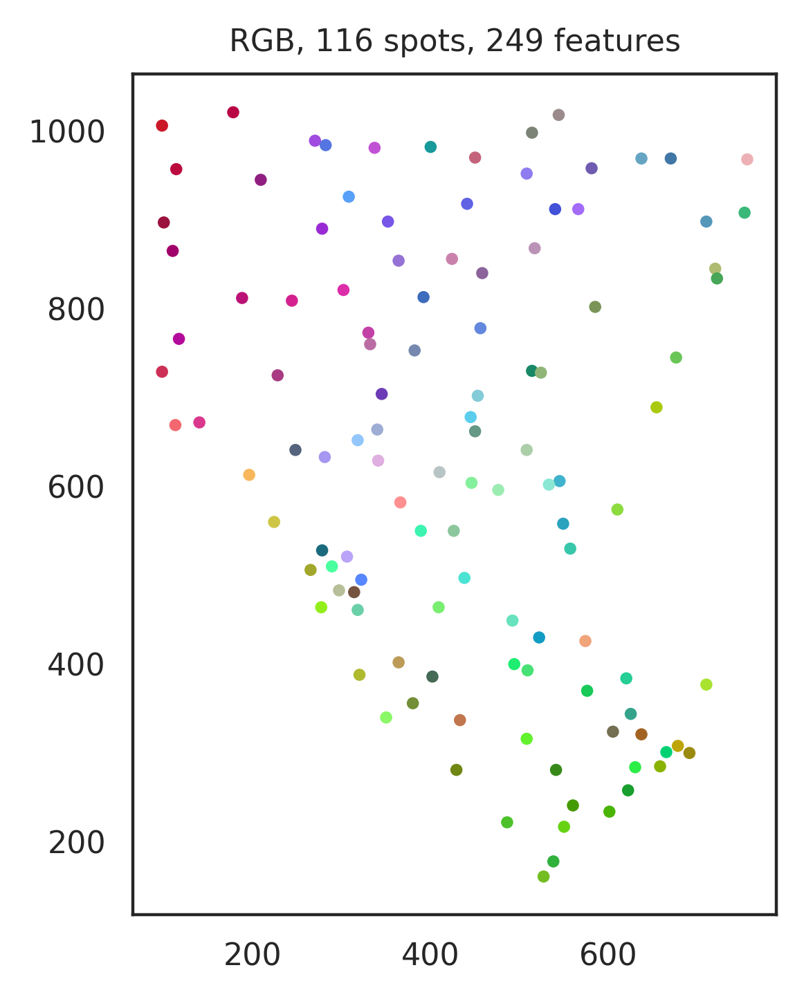

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/feature_dict.pickle
hippo_fov51
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/feature_dict.pickle
N_Unit: 116
N_Gene: 249
The new directory is created!
[[26. 11. 25. ... 44.  4. 36.]
 [12.  1. 10. ... 11.  3. 15.]
 [14. 11.  9. ... 11.  2. 28.]
 ...
 [ 0.  5.  0. ...  6.  0.  0.]
 [10.  9. 13. ...  0.  2. 17.]
 [ 8.  5.  4. ... 10.  3.  7.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/data.h5ad


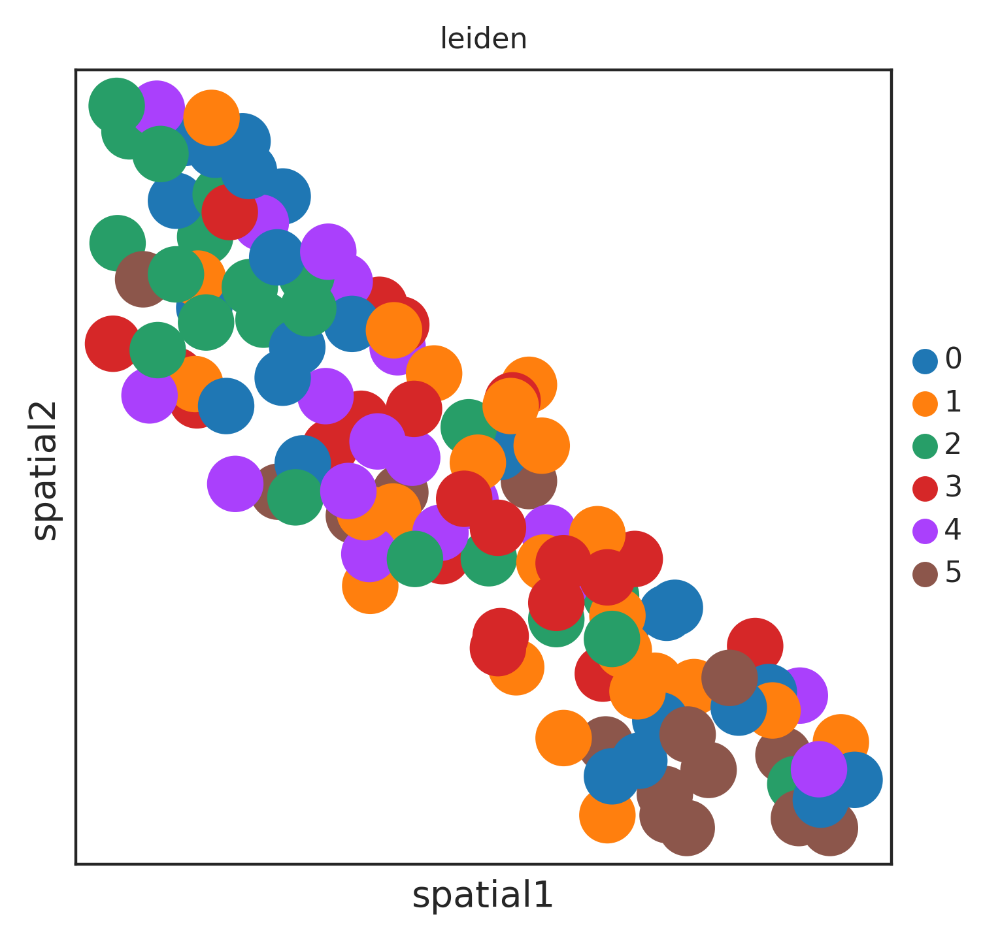

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


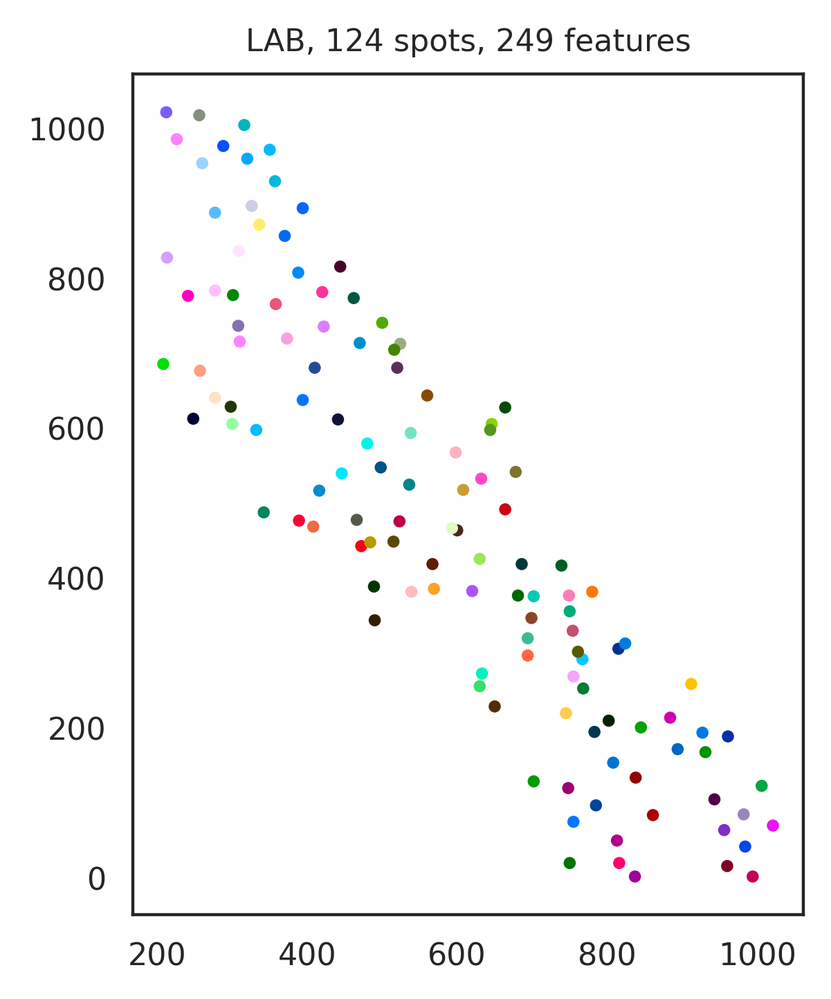

1.0 0.0


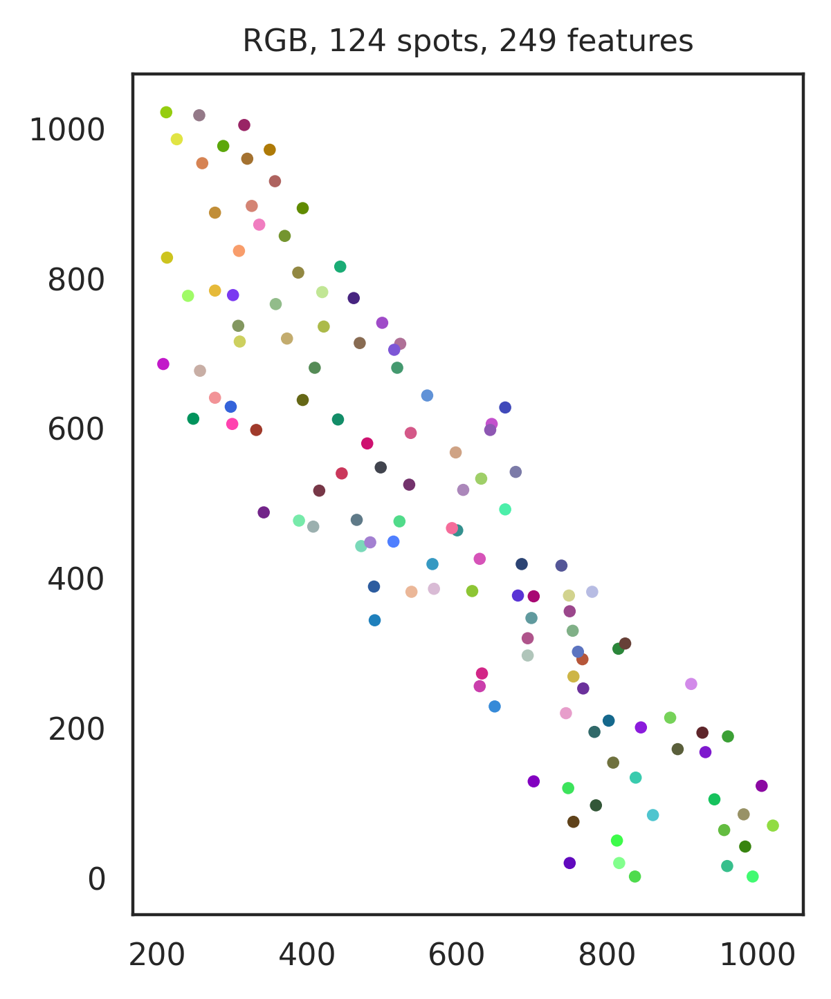

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/feature_dict.pickle
hippo_fov35
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/feature_dict.pickle
N_Unit: 124
N_Gene: 249
The new directory is created!
[[16. 14. 22. ... 55. 16. 62.]
 [ 6.  7.  8. ... 18.  5. 23.]
 [14.  7. 14. ... 28.  2. 21.]
 ...
 [ 0.  0.  4. ... 33.  7. 46.]
 [ 8.  4.  0. ...  6.  4. 13.]
 [ 7.  1. 11. ... 11.  3. 12.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/data.h5ad


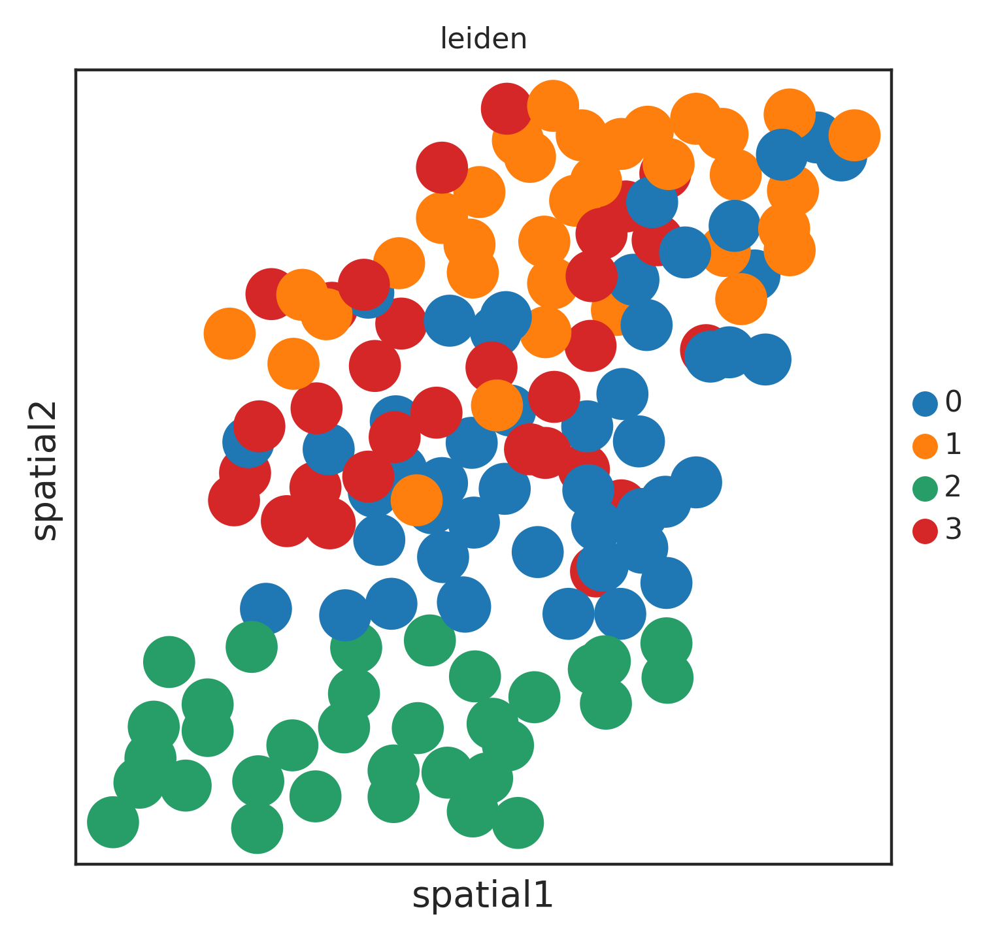

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 113 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


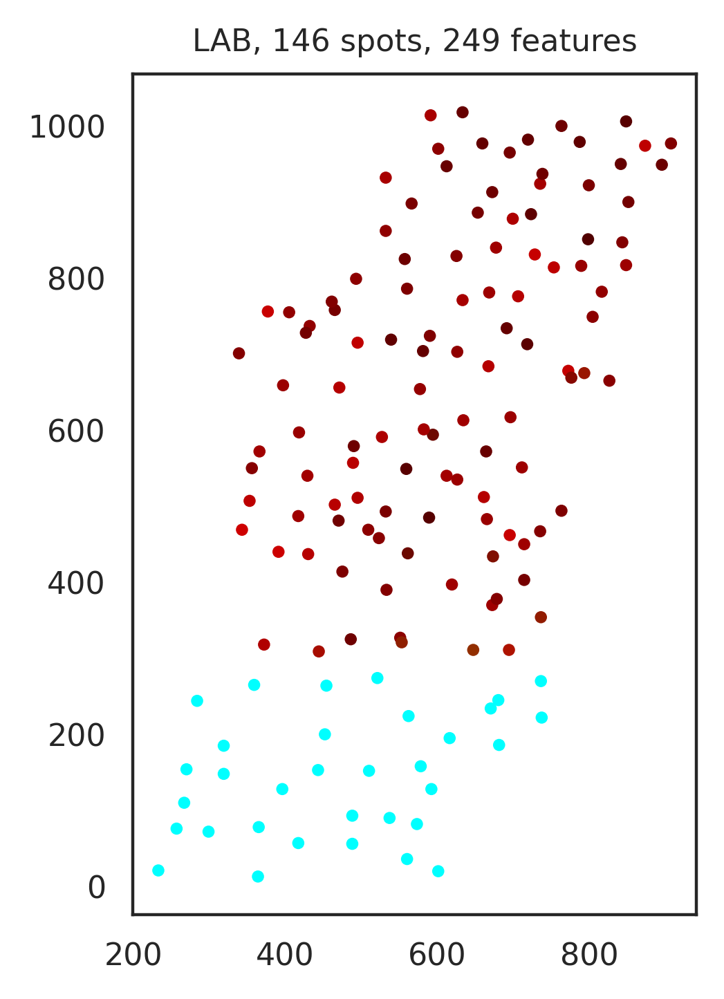

1.0 0.0


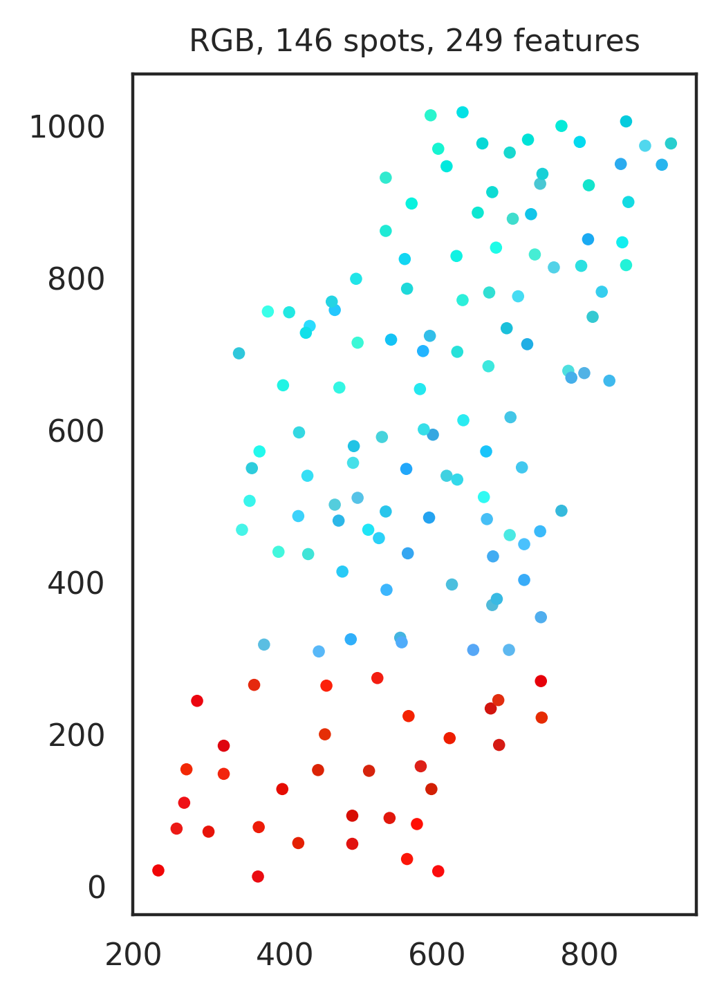

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/feature_dict.pickle
hippo_fov48
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/feature_dict.pickle
N_Unit: 146
N_Gene: 249
The new directory is created!
[[11. 26. 29. ... 38. 22. 31.]
 [10. 11. 16. ... 37. 15. 31.]
 [14. 25. 14. ... 17.  6. 33.]
 ...
 [26. 28. 22. ... 29.  9. 38.]
 [20. 15. 36. ... 51.  5. 35.]
 [17.  8. 16. ... 15.  5. 13.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/data.h5ad


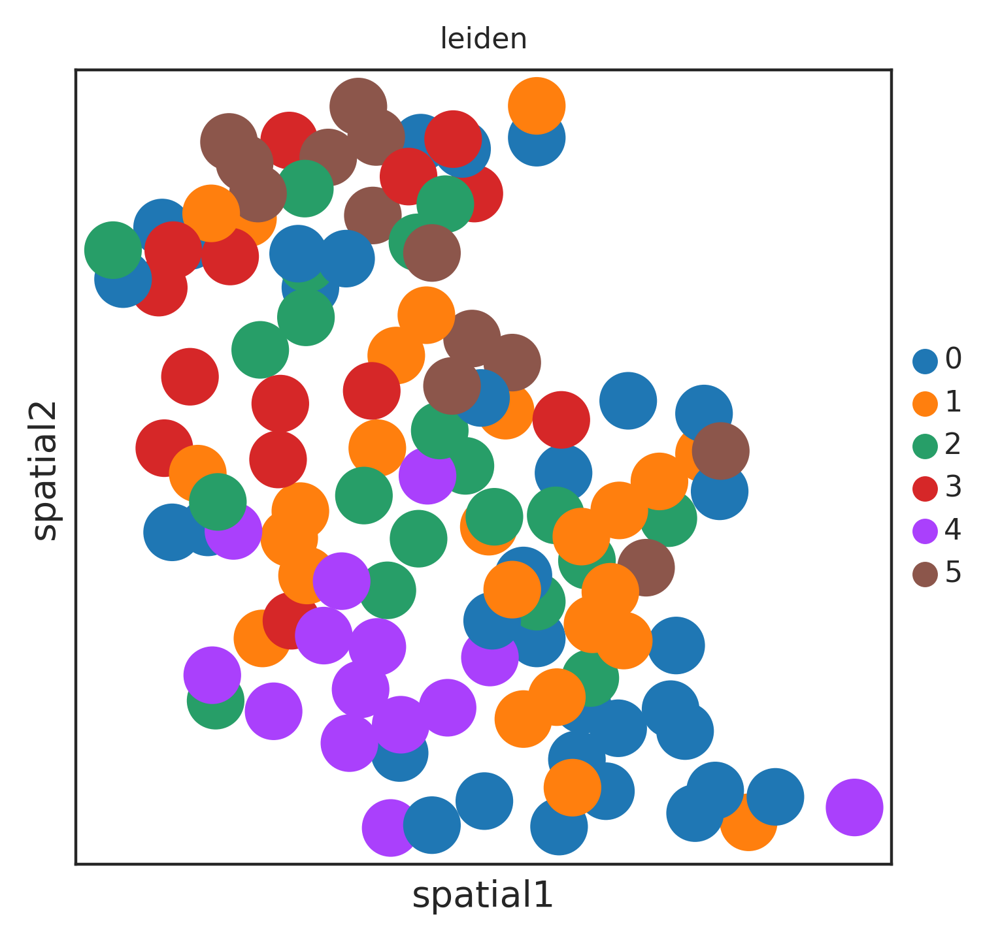

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


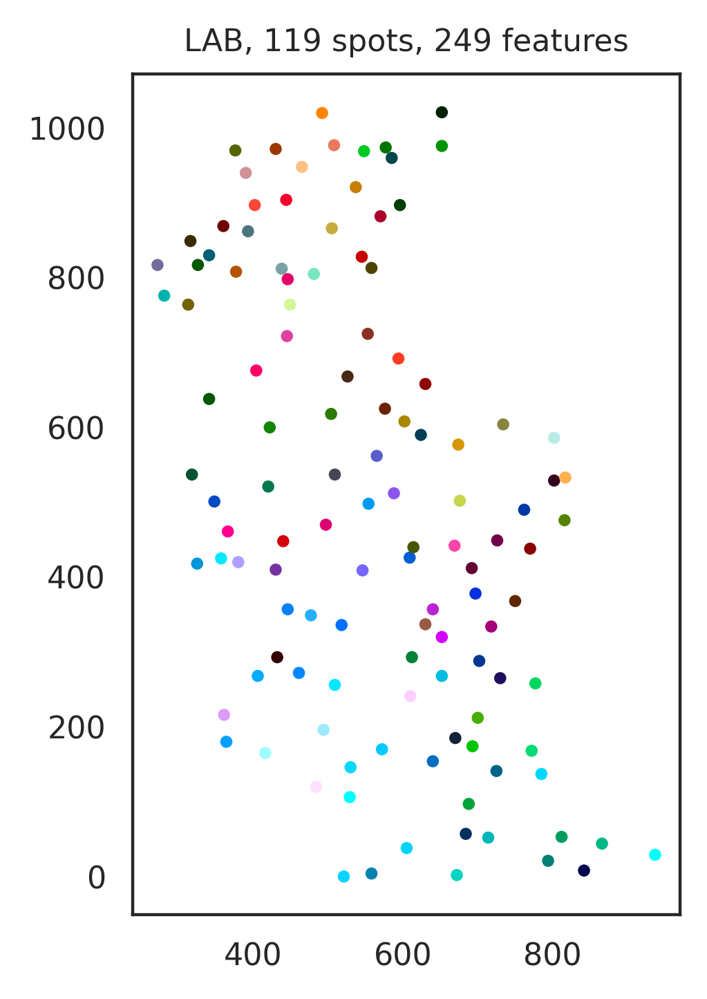

1.0 0.0


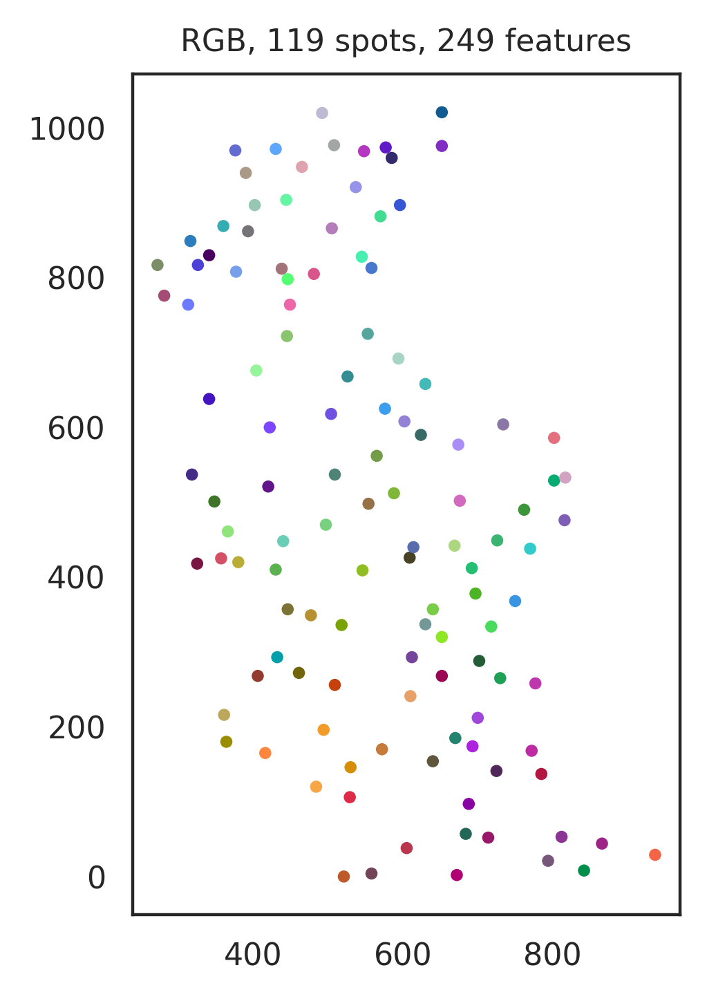

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/feature_dict.pickle
hippo_fov37
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/feature_dict.pickle
N_Unit: 119
N_Gene: 249
The new directory is created!
[[14. 13.  5. ... 31. 10. 11.]
 [ 2.  7.  9. ... 15.  5. 30.]
 [11. 18.  0. ... 18.  7. 16.]
 ...
 [15. 10.  5. ...  8.  6. 19.]
 [21.  0. 13. ...  6.  4. 23.]
 [ 7.  5. 29. ... 18. 34. 29.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/data.h5ad


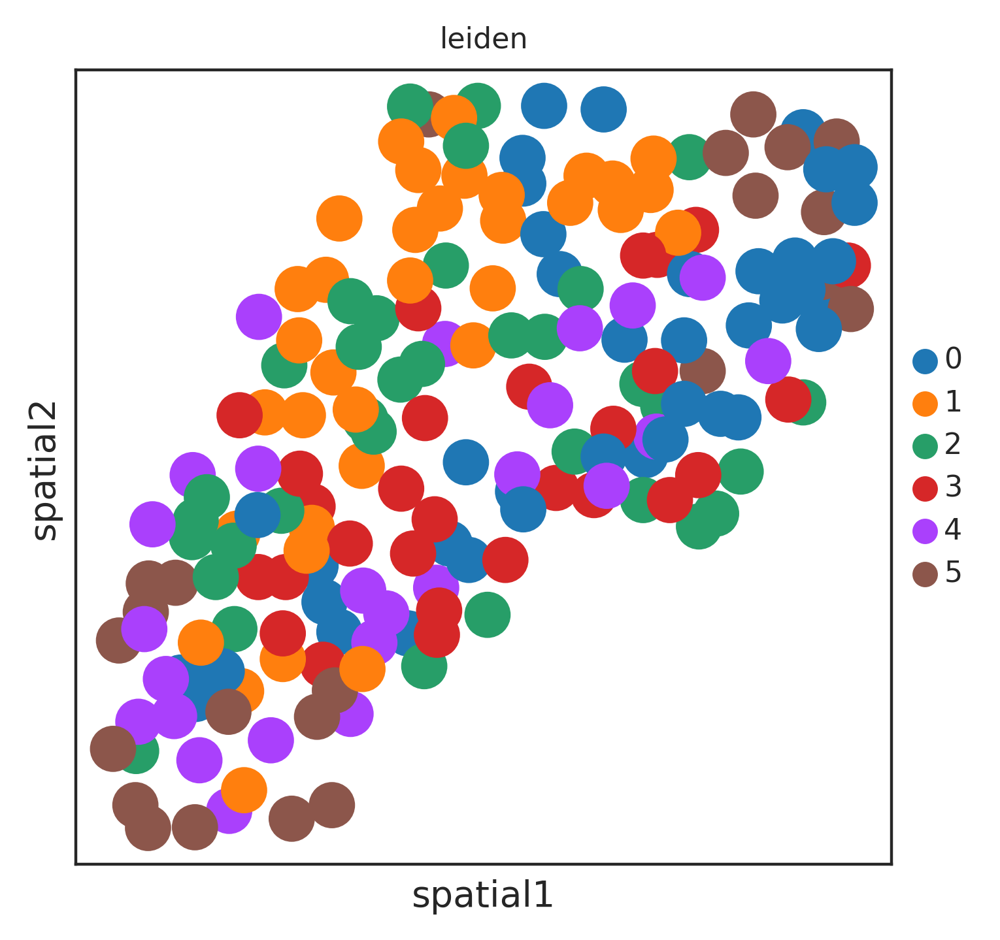

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


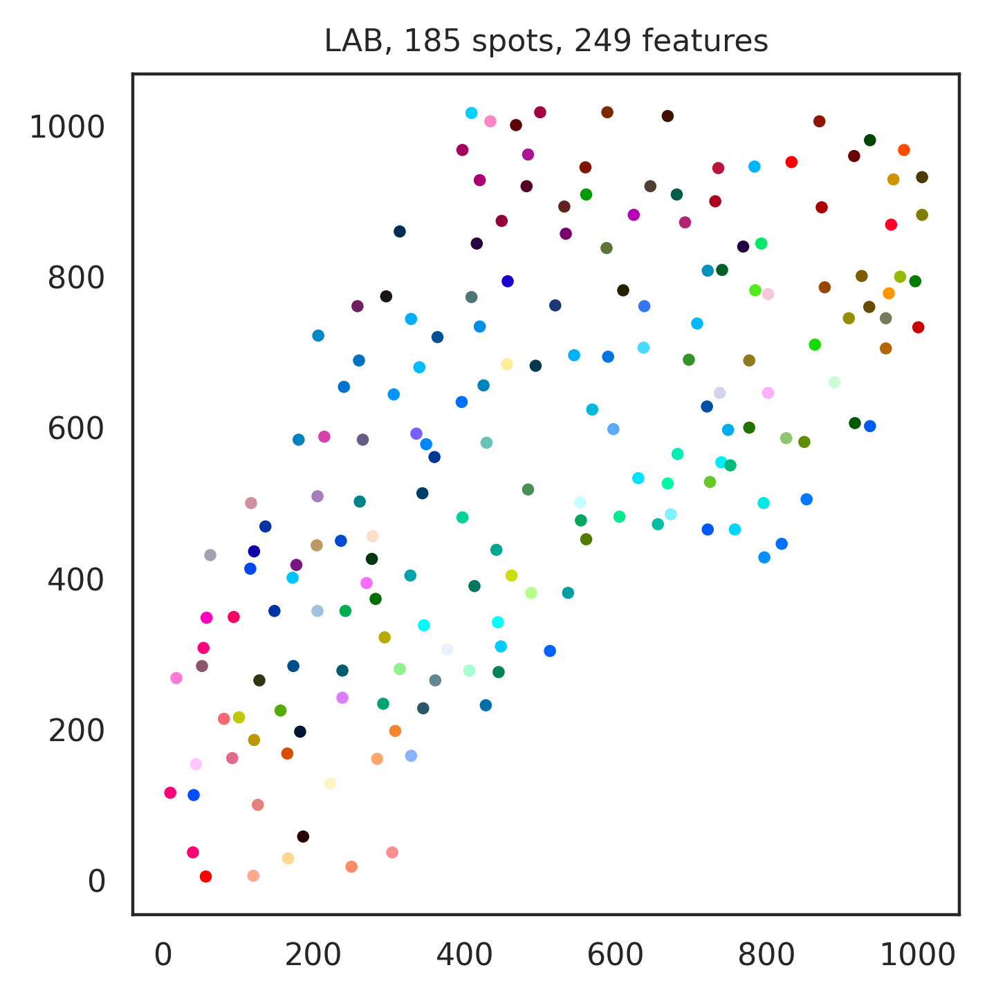

1.0 0.0


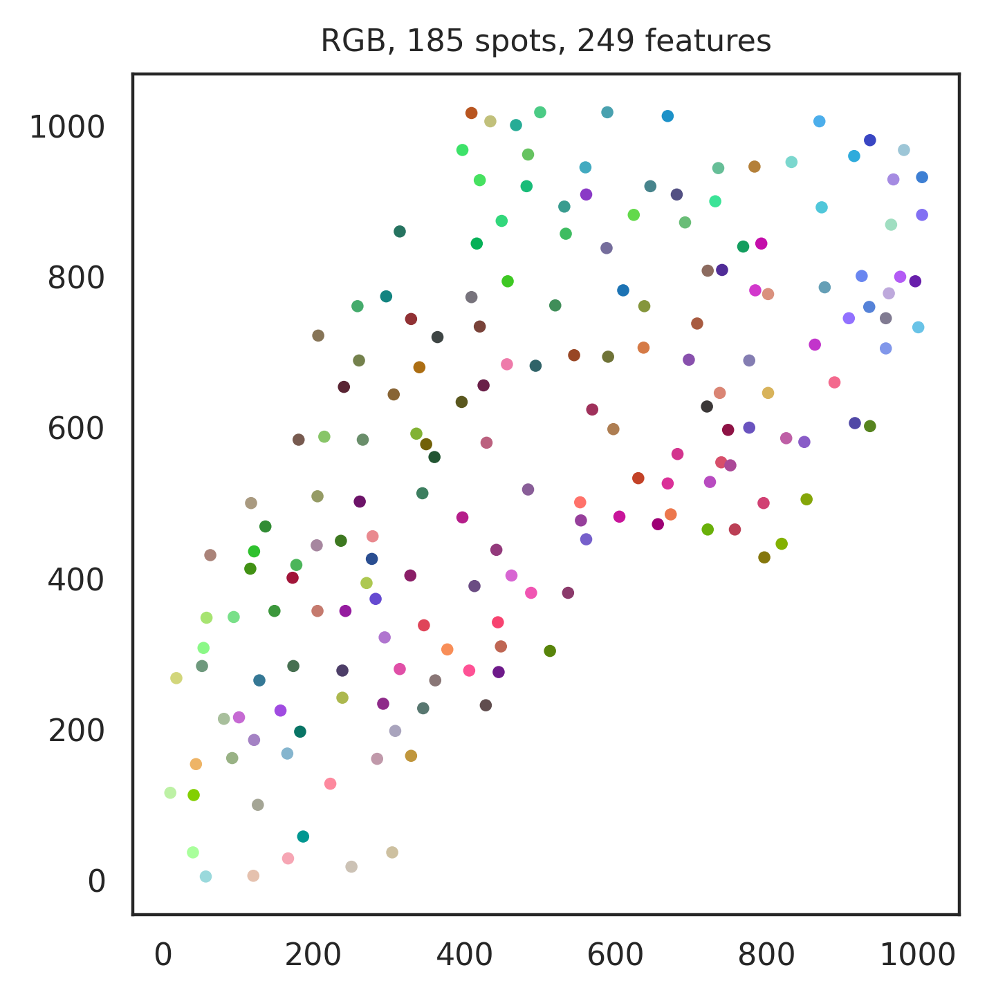

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/feature_dict.pickle
hippo_fov41
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/feature_dict.pickle
N_Unit: 185
N_Gene: 249
The new directory is created!
[[25. 20. 25. ... 63. 19. 72.]
 [19.  4.  3. ... 24.  4. 33.]
 [43. 20. 32. ... 48.  5. 54.]
 ...
 [ 0.  0.  0. ...  0.  1.  4.]
 [13. 14.  6. ... 21.  6. 24.]
 [21. 12. 21. ... 30.  6. 25.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/data.h5ad


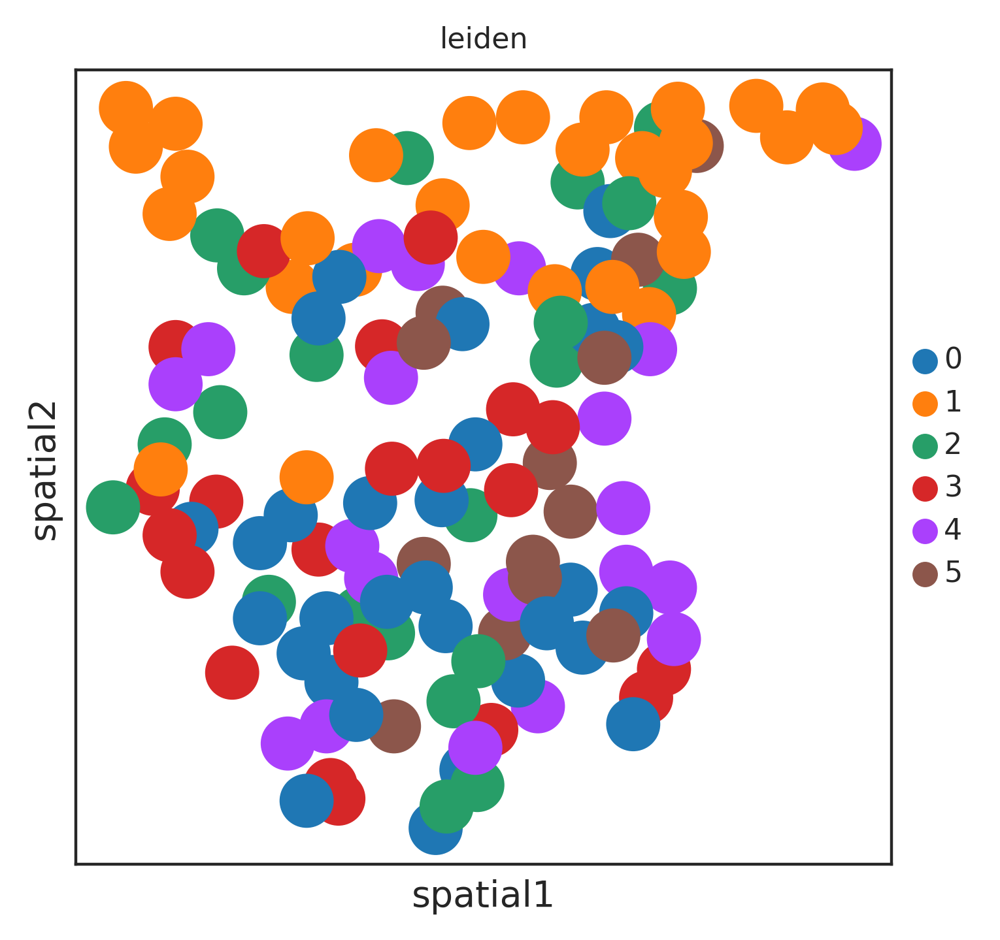

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


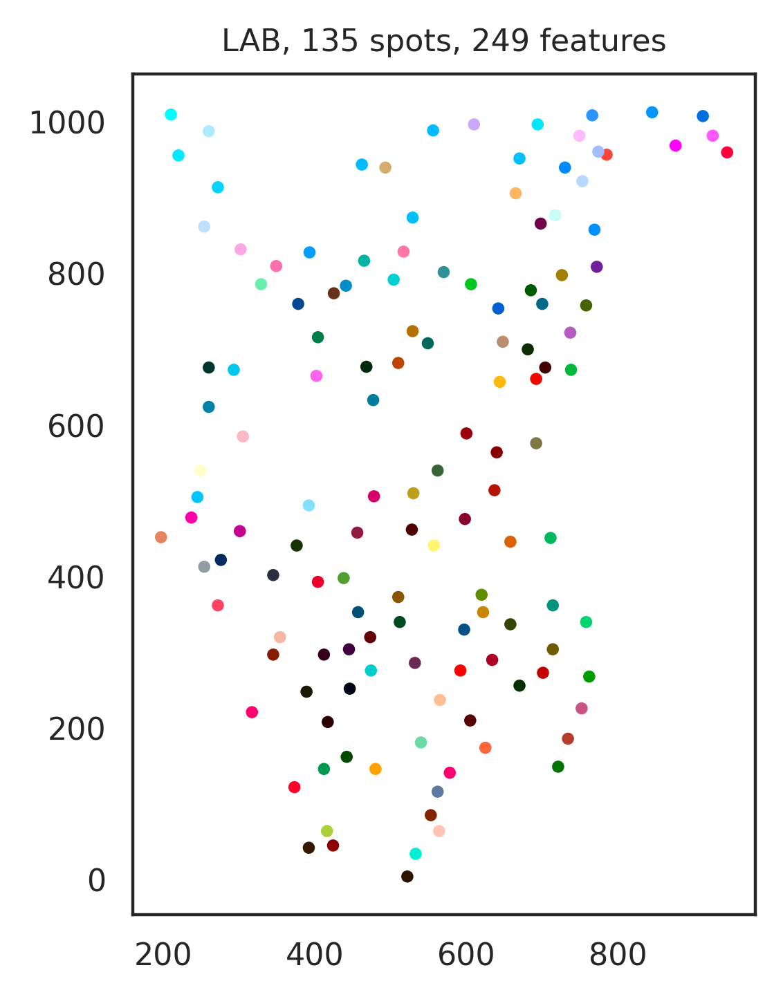

1.0 0.0


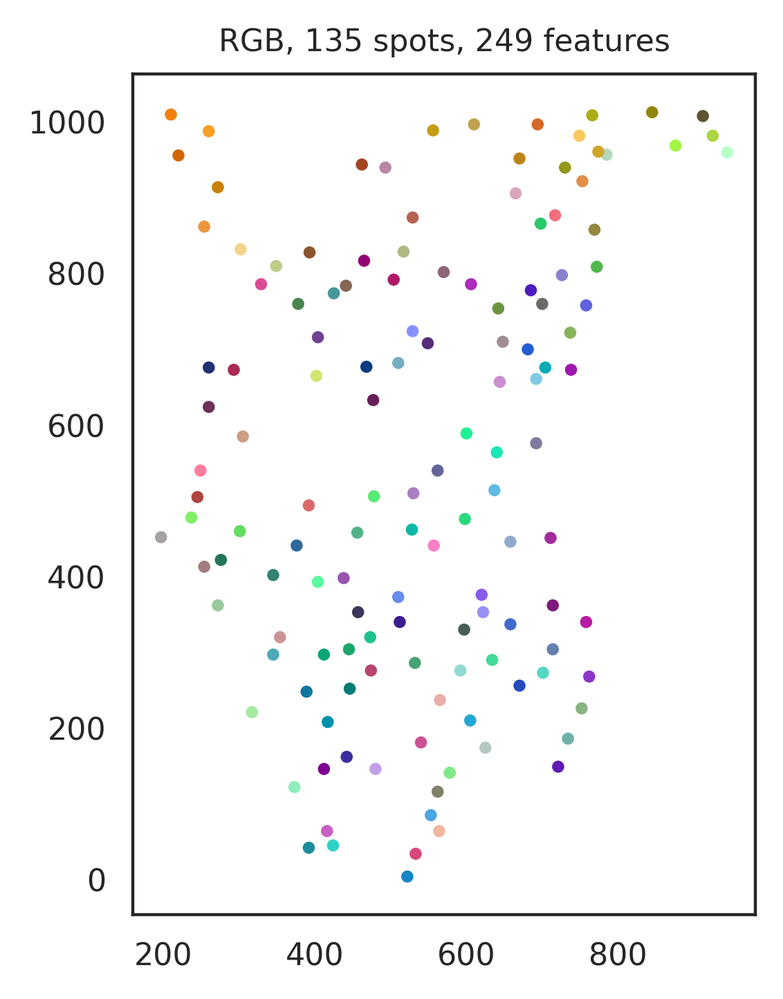

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/feature_dict.pickle
hippo_fov40
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/feature_dict.pickle
N_Unit: 135
N_Gene: 249
The new directory is created!
[[21. 19. 49. ... 74. 24. 51.]
 [19. 28. 35. ... 38.  0. 41.]
 [17.  0. 13. ... 22.  5. 41.]
 ...
 [35.  9. 28. ... 36.  8. 46.]
 [23. 15.  6. ... 35. 14. 26.]
 [23. 17. 28. ... 29.  5. 45.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/data.h5ad


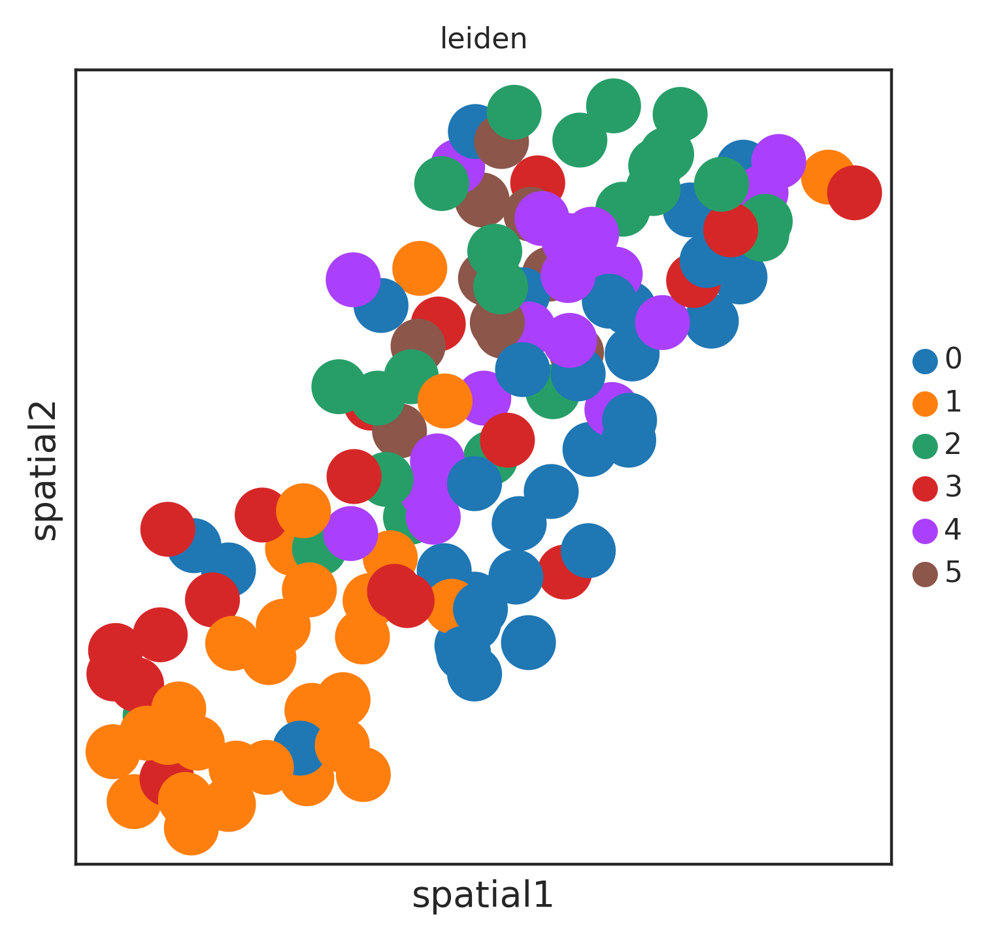

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 9 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


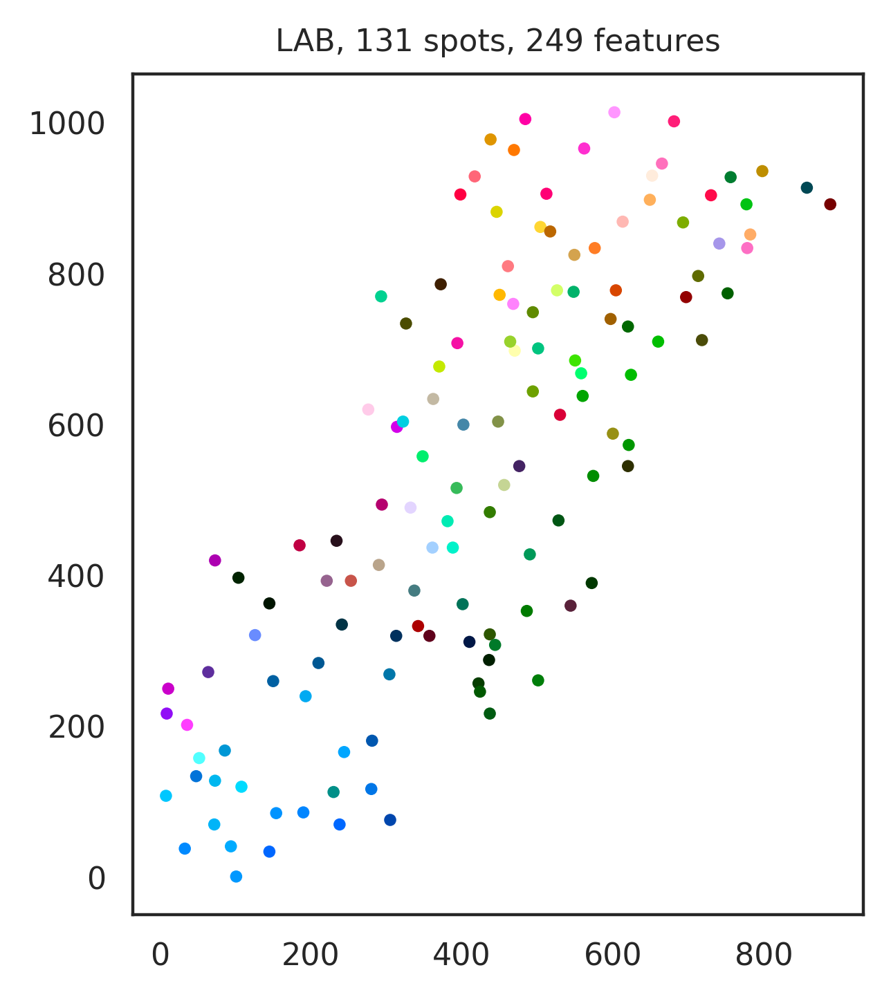

1.0 0.0


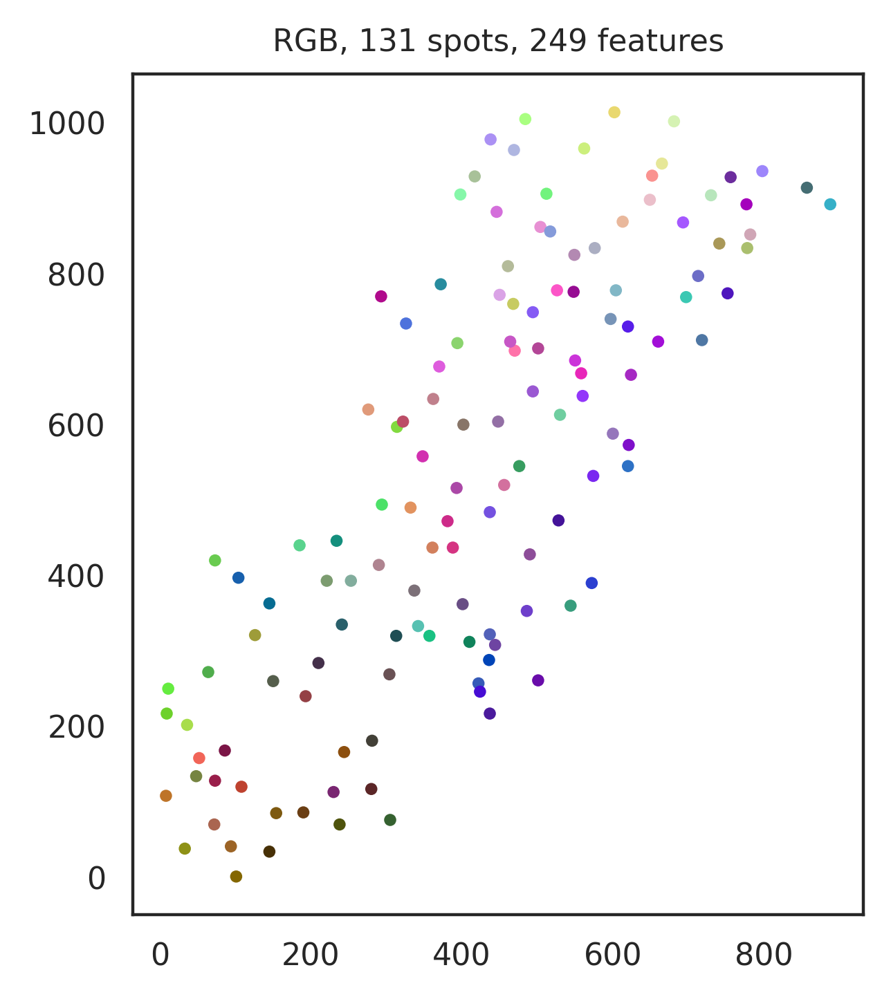

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/feature_dict.pickle
hippo_fov49
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/feature_dict.pickle
N_Unit: 131
N_Gene: 249
The new directory is created!
[[ 8. 12. 18. ... 20.  2. 28.]
 [20.  8.  9. ... 27.  8. 17.]
 [20. 19. 12. ... 17.  9. 34.]
 ...
 [16.  9.  5. ... 14.  6. 27.]
 [12. 16. 16. ...  9.  9. 11.]
 [ 9.  4. 11. ...  5.  1.  7.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/data.h5ad


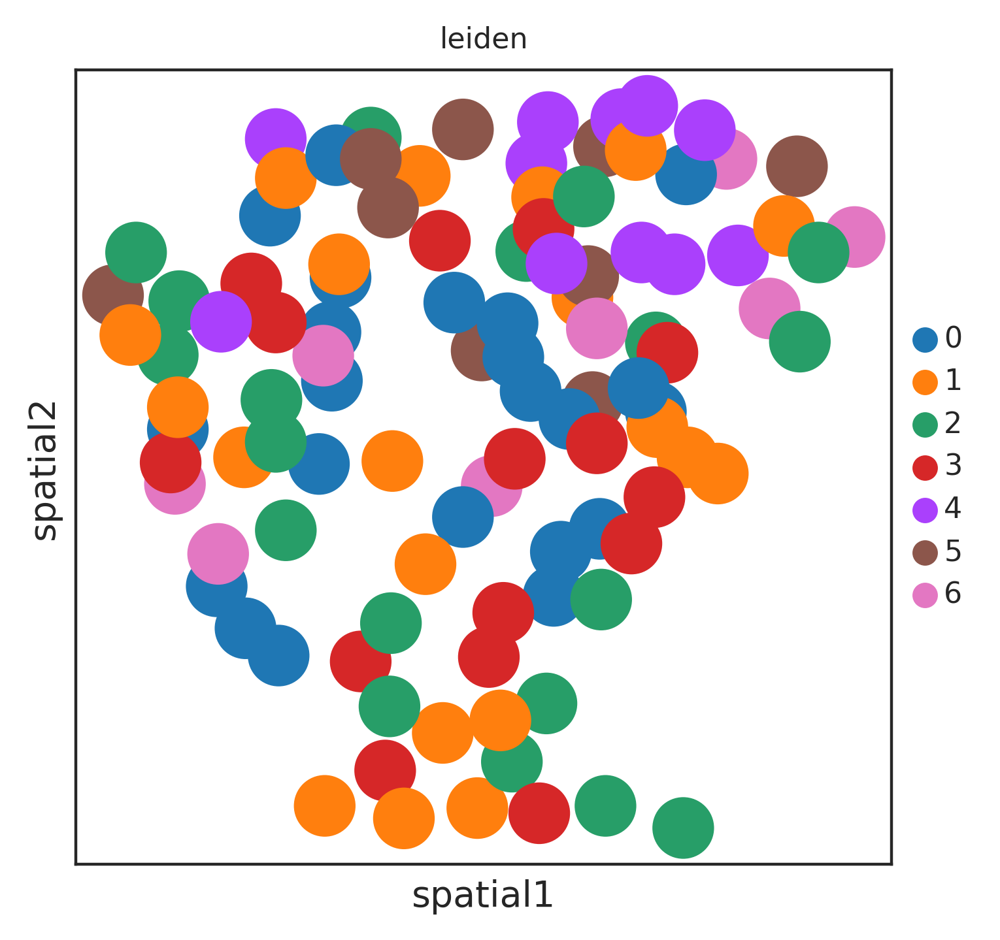

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


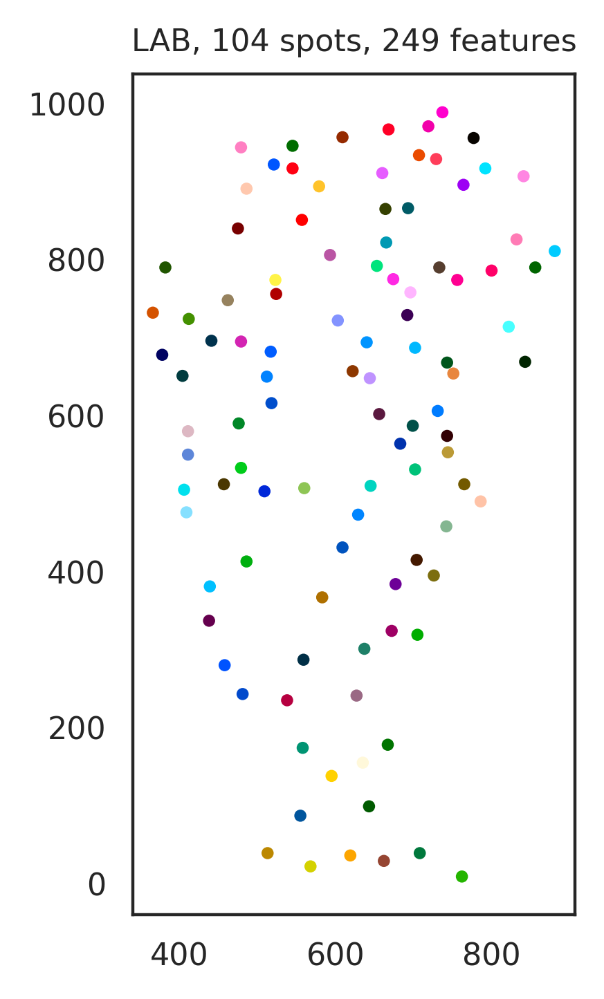

1.0 0.0


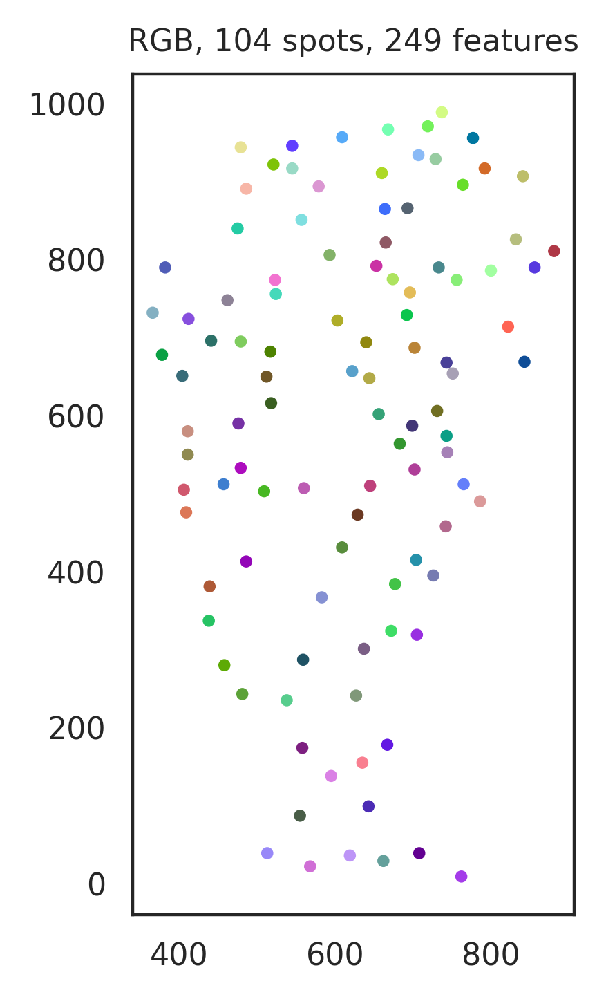

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/feature_dict.pickle
hippo_fov39
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/feature_dict.pickle
N_Unit: 104
N_Gene: 249
The new directory is created!
[[ 0.  1. 17. ... 21.  6. 19.]
 [ 7. 17. 22. ... 41. 17. 49.]
 [ 4. 26. 13. ... 28.  9. 29.]
 ...
 [16.  7. 13. ... 15.  4. 36.]
 [ 8. 15. 25. ... 14.  2. 25.]
 [13.  7. 21. ... 26.  4. 23.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov47/data.h5ad


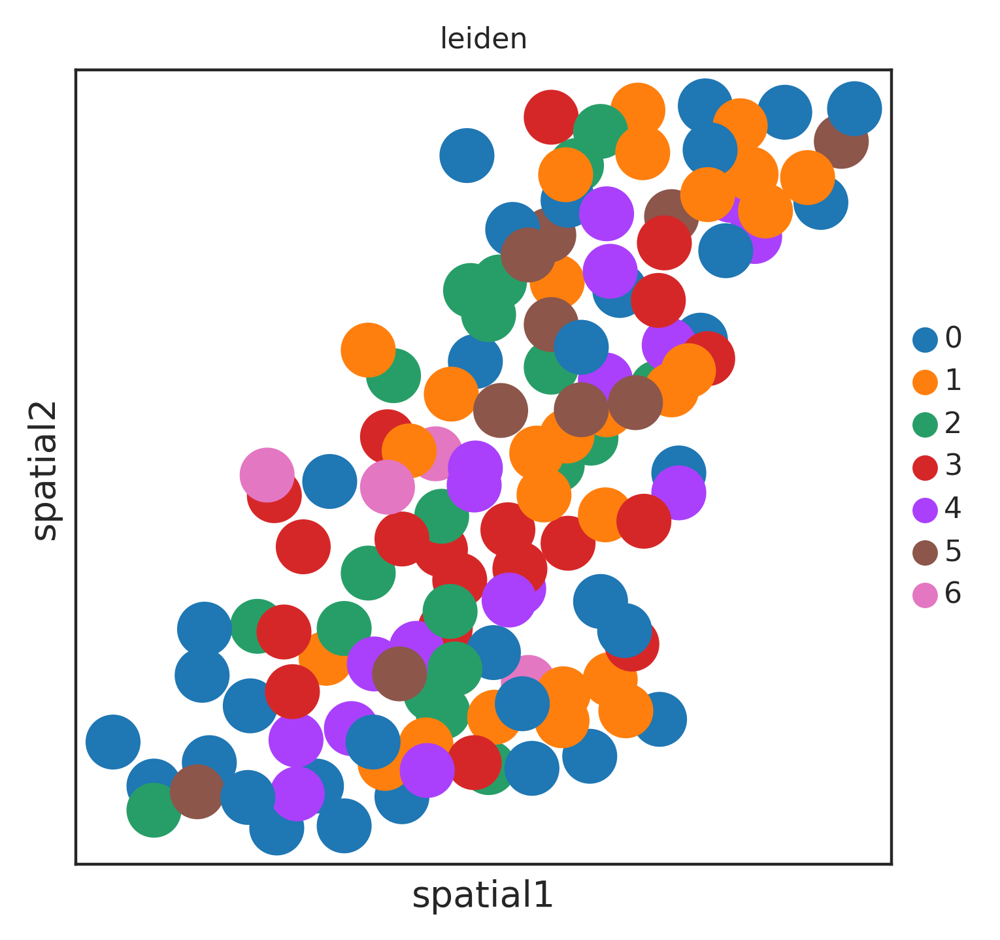

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 14 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


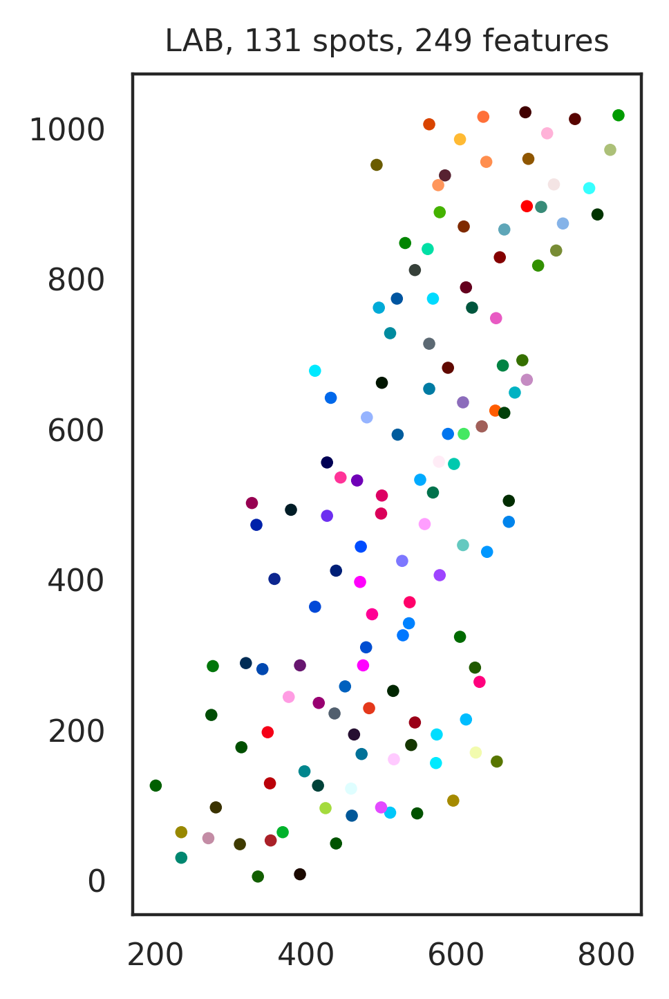

1.0 0.0


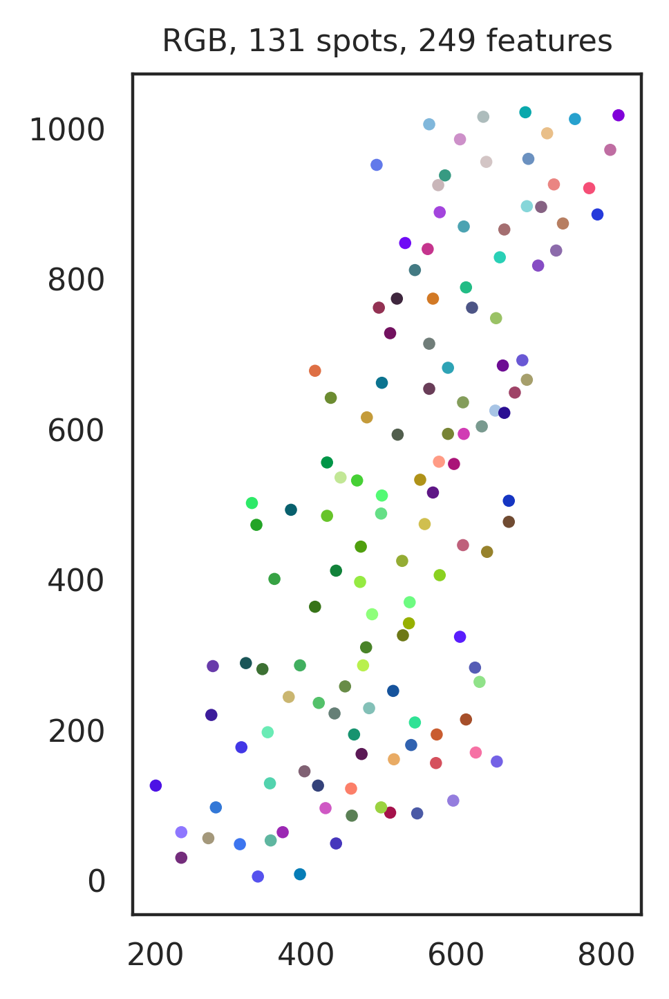

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov47/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov47/feature_dict.pickle
hippo_fov47
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov47/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov47/feature_dict.pickle
N_Unit: 131
N_Gene: 249
The new directory is created!
[[25. 17. 29. ... 54. 17. 44.]
 [18. 17.  9. ... 34.  7. 19.]
 [29. 18. 12. ... 21.  5. 22.]
 ...
 [13. 12. 10. ...  2.  3.  9.]
 [ 2.  6. 15. ...  7.  1. 12.]
 [23. 16. 22. ... 14.  3. 22.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov34/data.h5ad


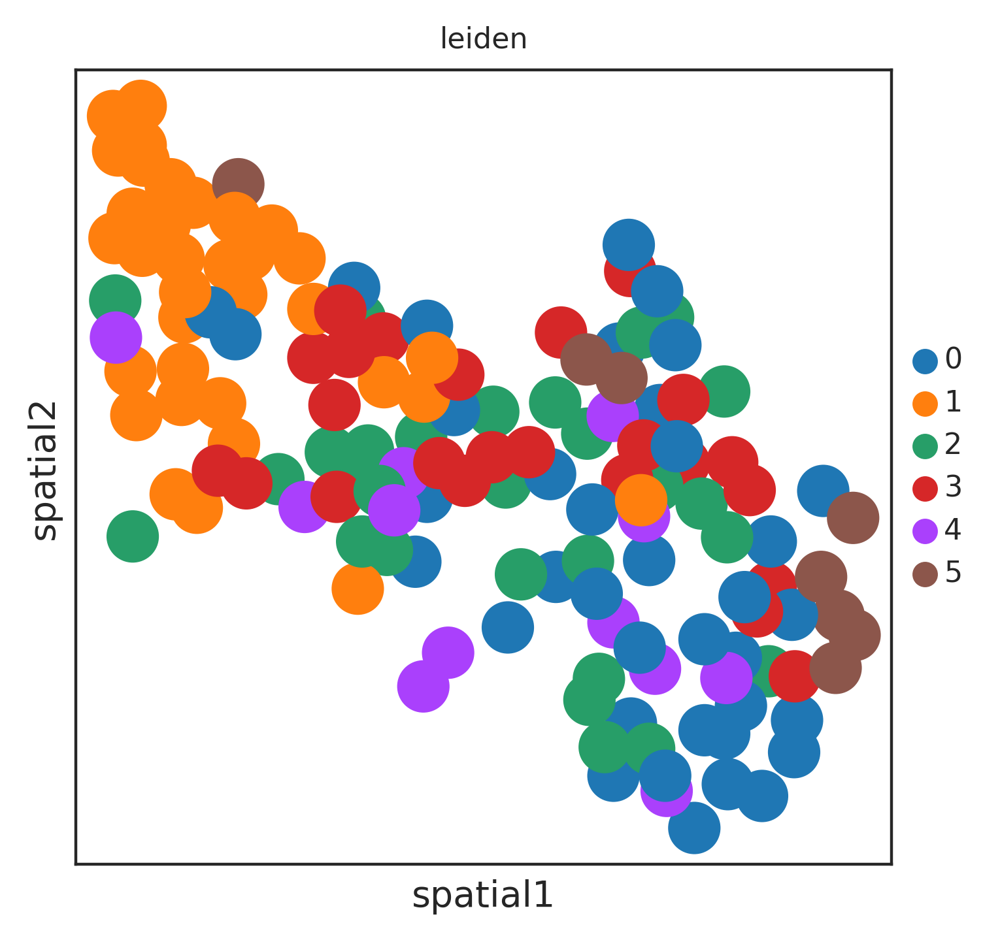

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 14 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


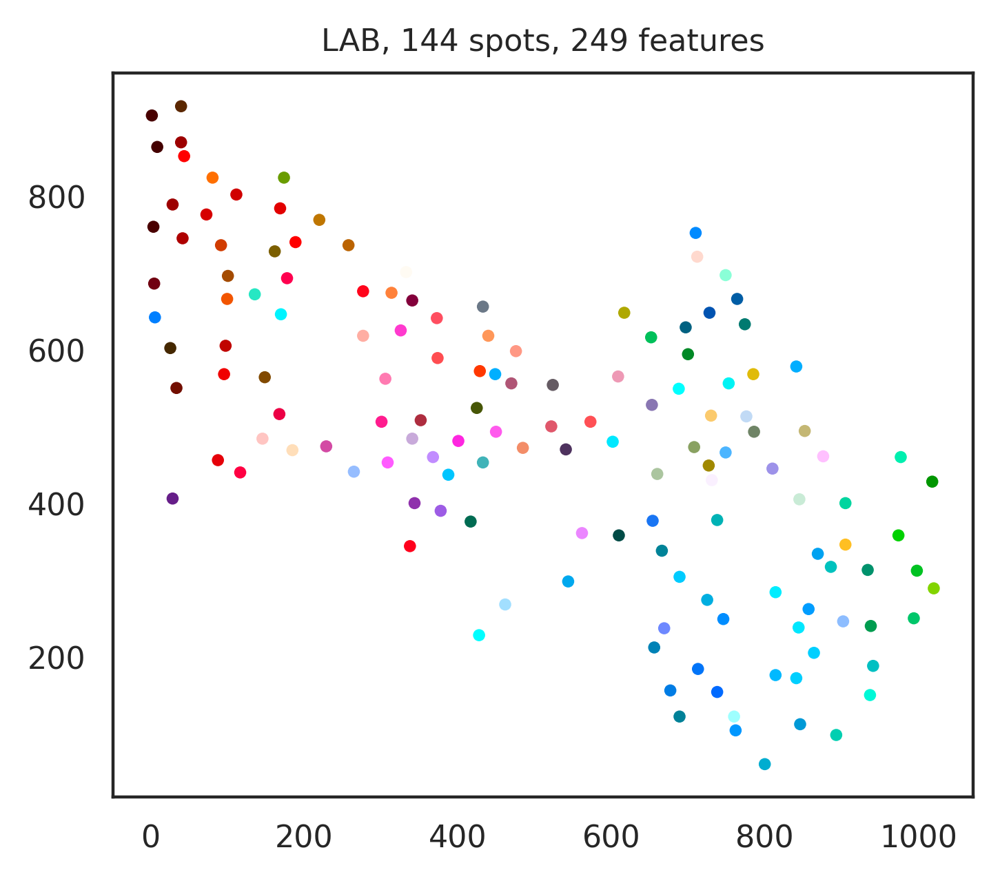

1.0 0.0


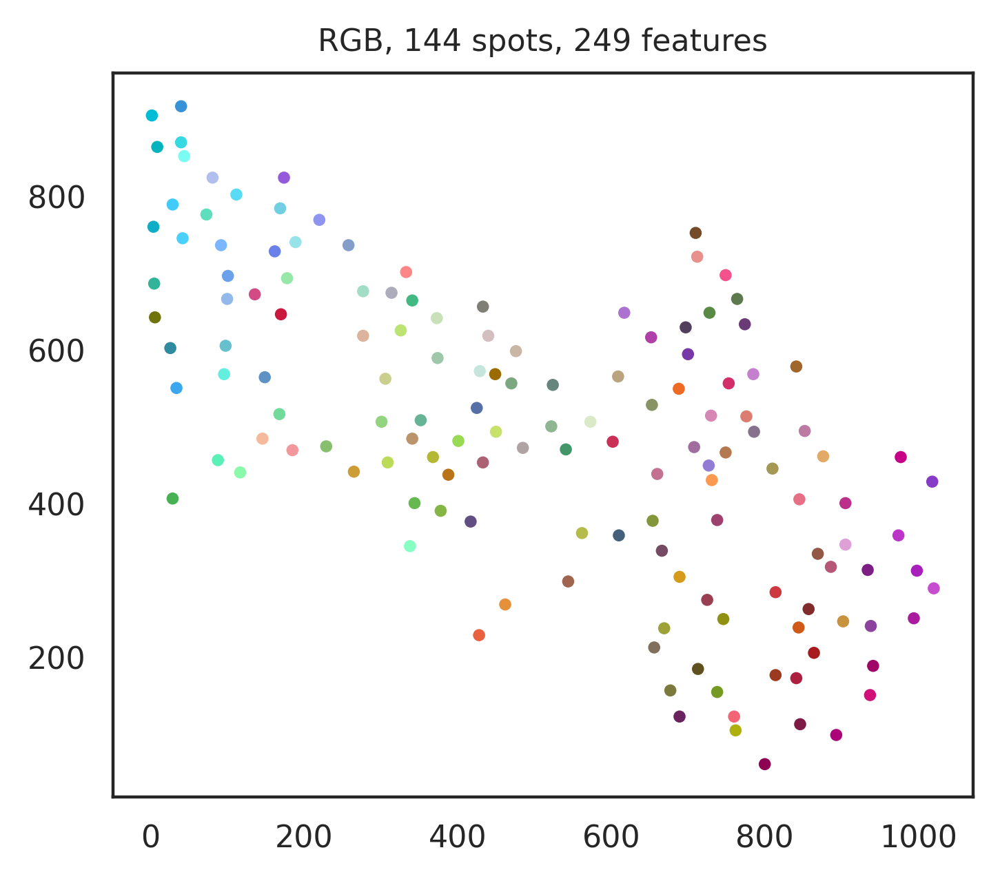

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov34/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov34/feature_dict.pickle
hippo_fov34
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov34/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov34/feature_dict.pickle
N_Unit: 144
N_Gene: 249
The new directory is created!
[[ 4.  1.  5. ... 18. 13.  3.]
 [ 7.  0.  0. ...  5.  0.  7.]
 [15.  7.  5. ...  0.  1. 11.]
 ...
 [ 4.  3.  0. ...  1.  0.  3.]
 [ 1.  2.  6. ...  1.  3.  3.]
 [ 4.  0.  0. ...  5.  1.  2.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov53/data.h5ad


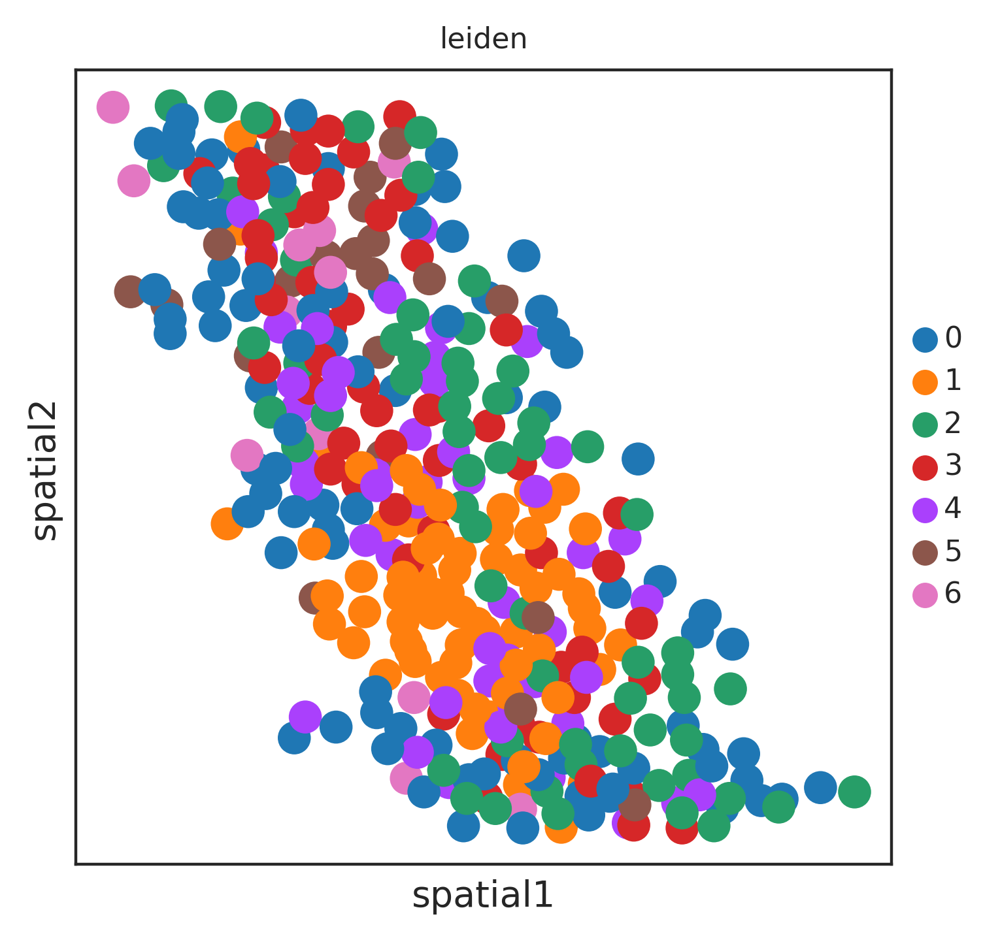

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 26 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


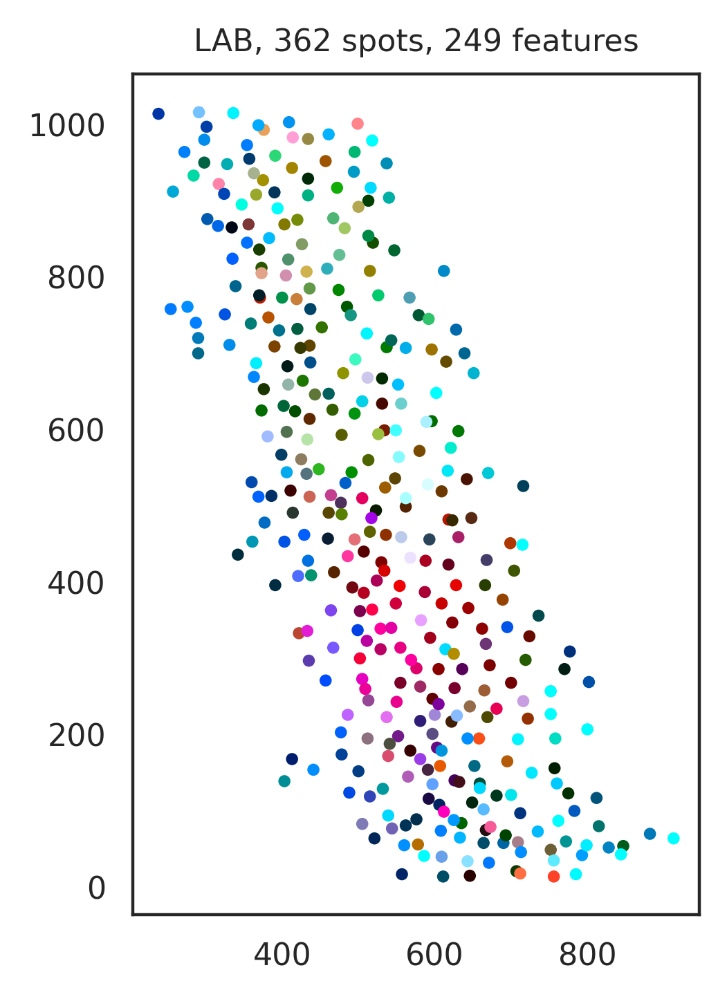

1.0 0.0


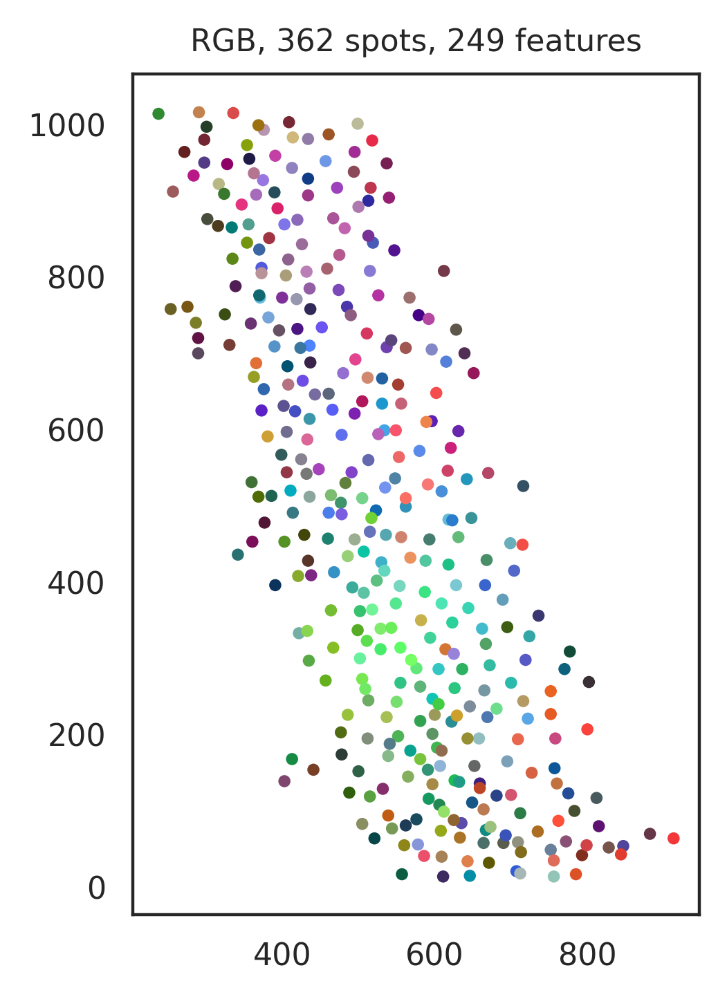

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov53/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov53/feature_dict.pickle
hippo_fov53
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov53/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov53/feature_dict.pickle
N_Unit: 362
N_Gene: 249
The new directory is created!
[[ 4.  3.  9. ... 22. 10. 20.]
 [ 4.  5.  5. ... 13. 14. 14.]
 [ 6.  8.  5. ... 23.  7. 29.]
 ...
 [ 8.  7.  2. ...  7.  1. 11.]
 [ 2.  0.  6. ...  5.  1. 17.]
 [ 1.  4.  8. ...  8.  1. 11.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov42/data.h5ad


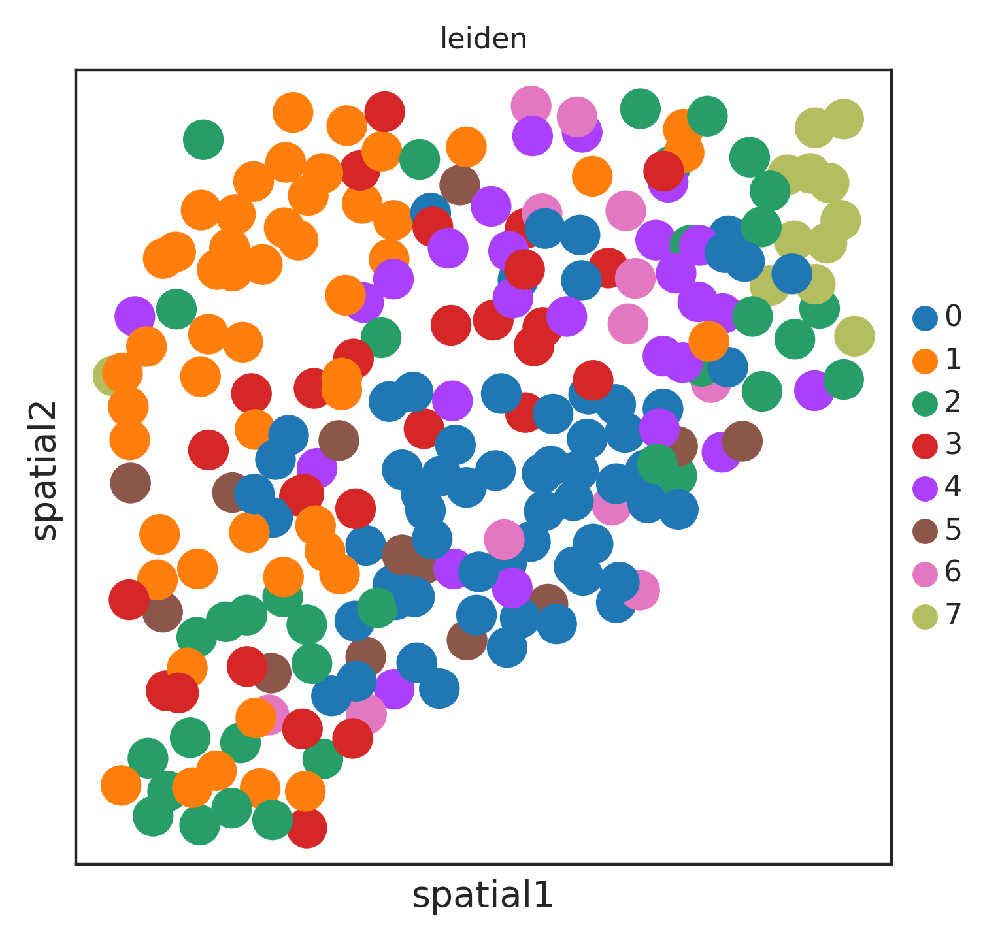

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


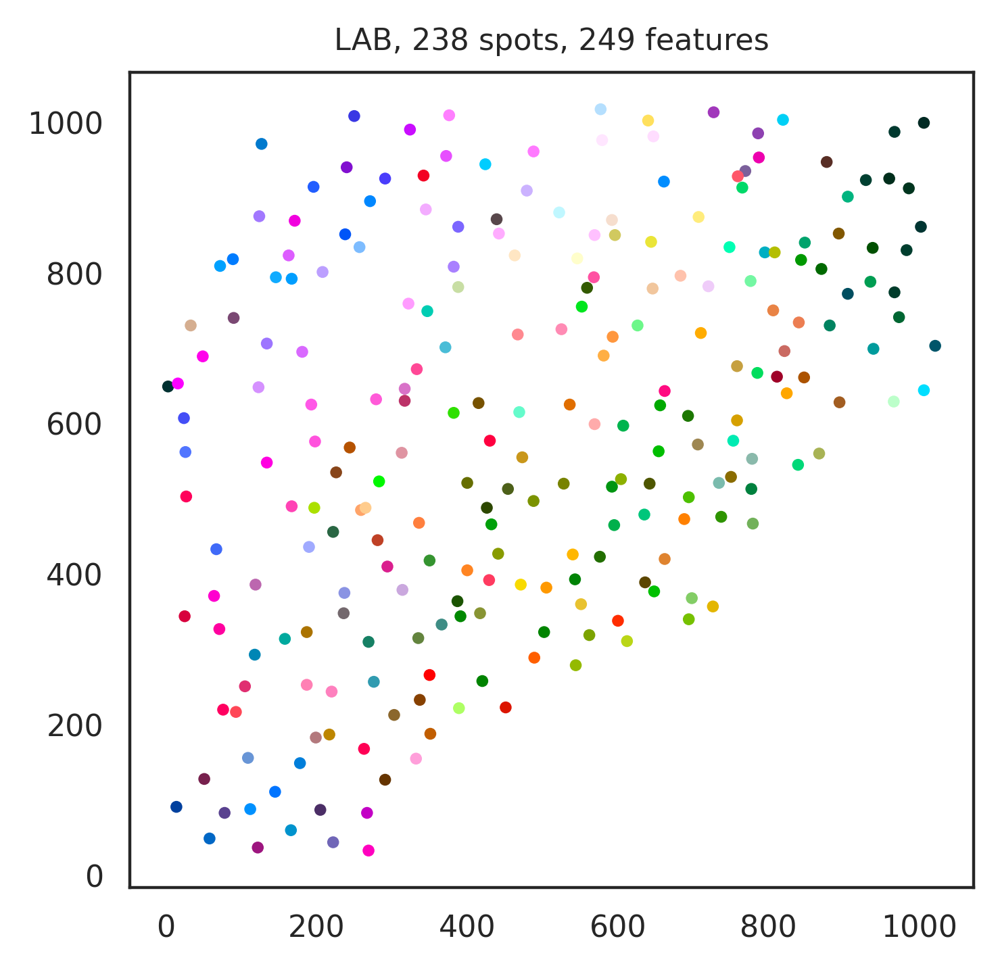

1.0 0.0


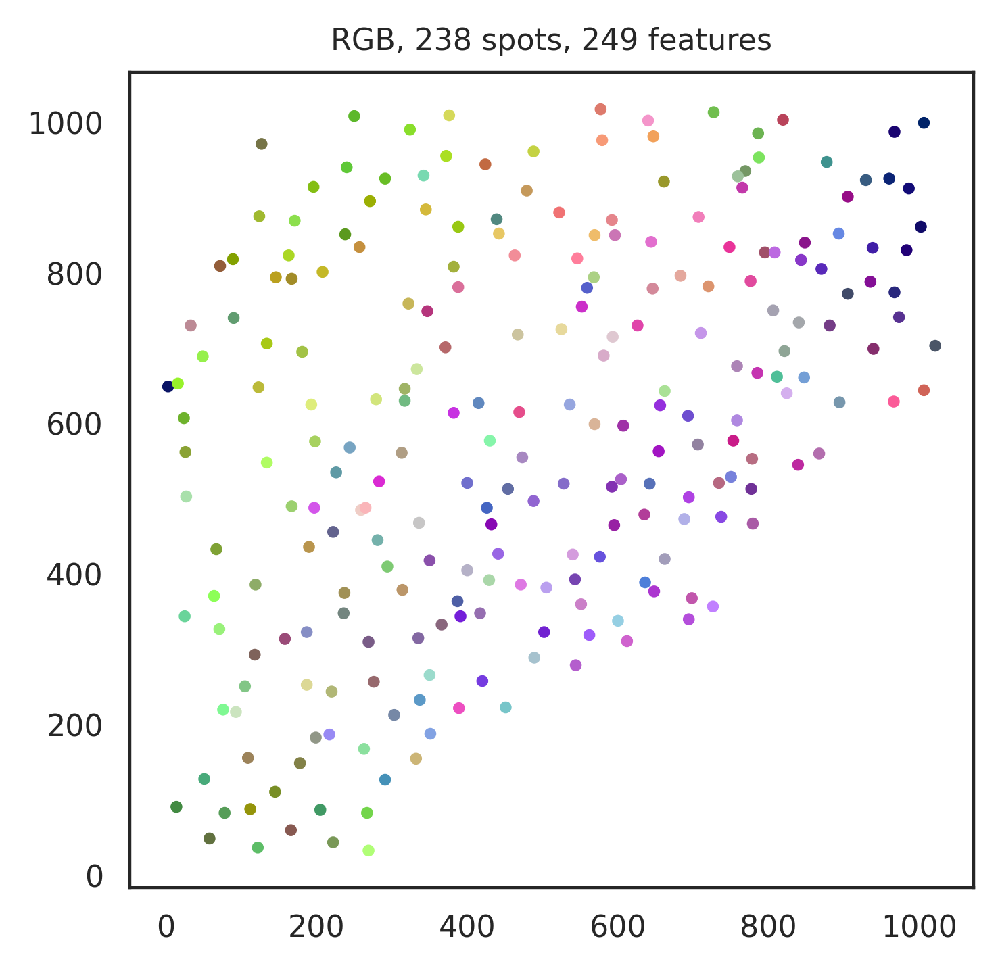

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov42/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov42/feature_dict.pickle
hippo_fov42
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov42/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov42/feature_dict.pickle
N_Unit: 238
N_Gene: 249
The new directory is created!
[[13.  1.  2. ... 26.  9. 16.]
 [ 9. 22. 10. ... 32.  7. 55.]
 [ 2.  6.  4. ... 28.  7.  9.]
 ...
 [ 1. 13. 19. ... 18.  5. 41.]
 [ 4.  2. 19. ... 33. 12. 40.]
 [ 0.  7. 15. ...  3.  5.  5.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov45/data.h5ad


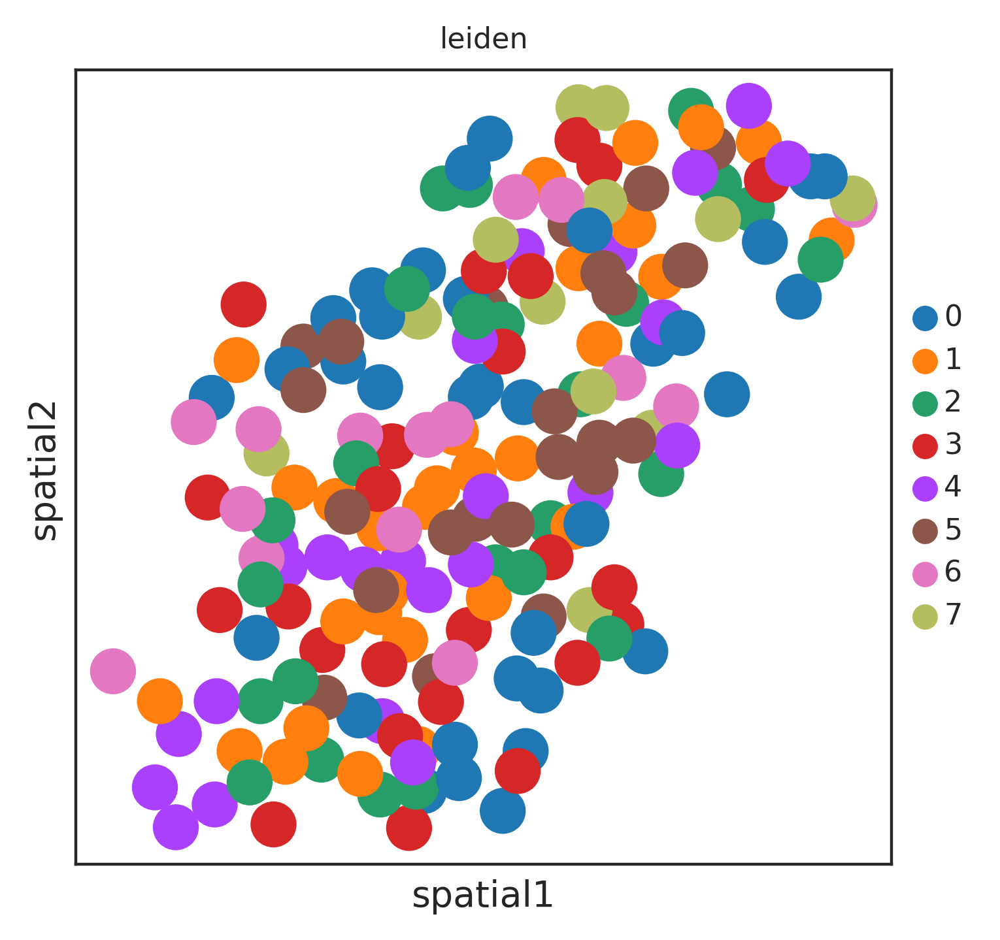

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


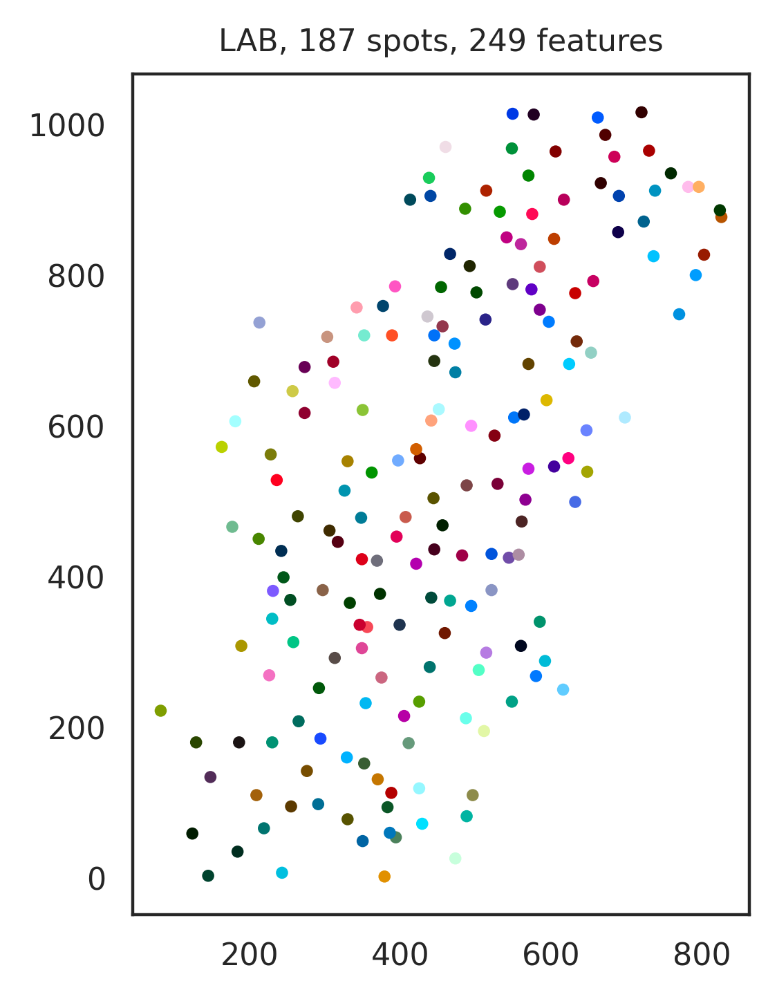

1.0 0.0


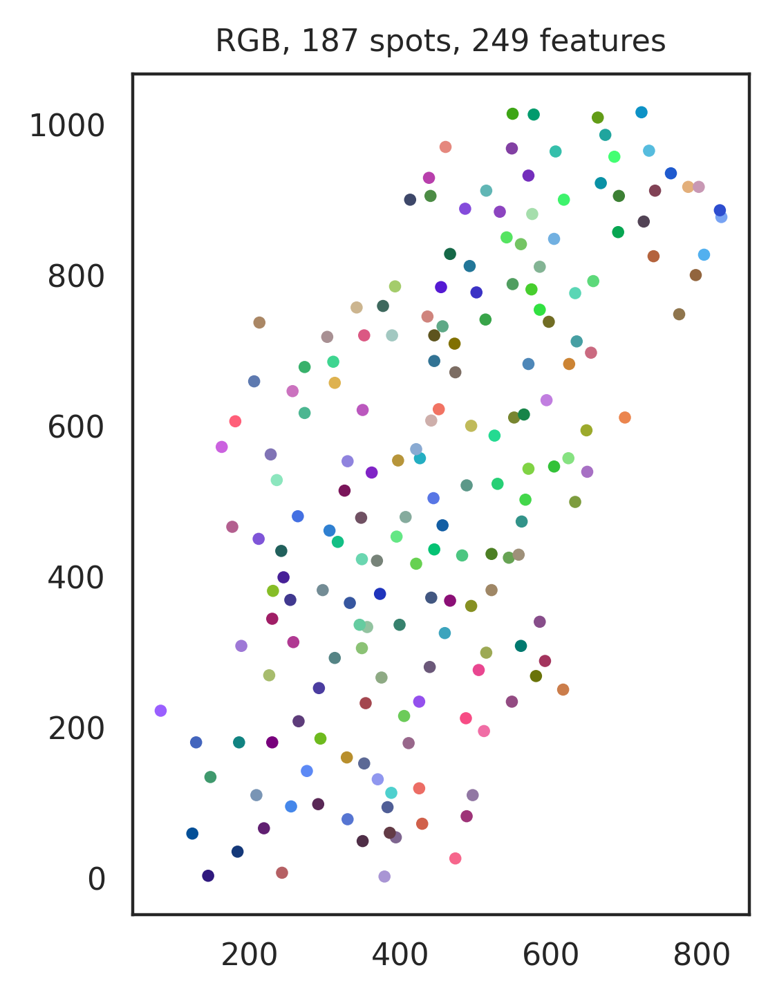

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov45/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov45/feature_dict.pickle
hippo_fov45
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov45/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov45/feature_dict.pickle
N_Unit: 187
N_Gene: 249
The new directory is created!
[[34. 14. 29. ... 54. 11. 30.]
 [18. 15. 23. ... 13.  6. 27.]
 [15. 11. 32. ... 47. 13. 31.]
 ...
 [19.  8. 15. ... 45.  8. 37.]
 [16. 12. 30. ... 12.  1. 39.]
 [ 9. 16. 16. ... 12.  8. 24.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov33/data.h5ad


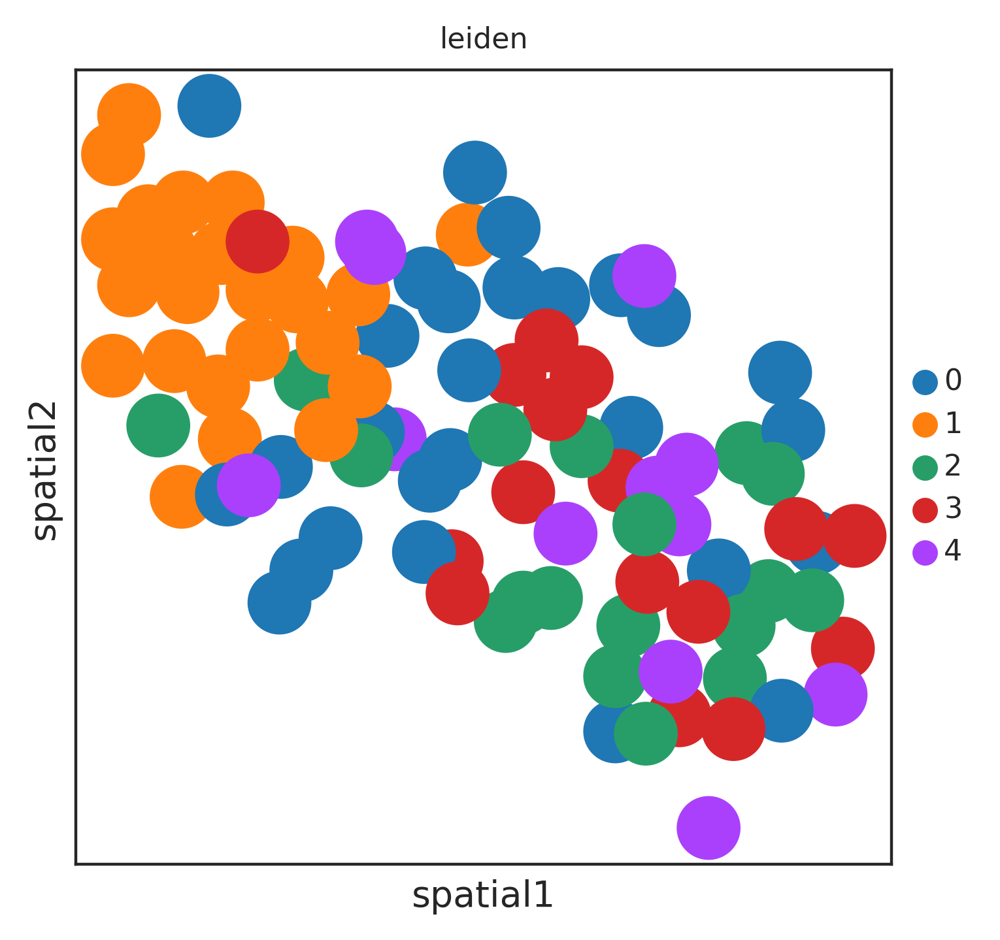

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


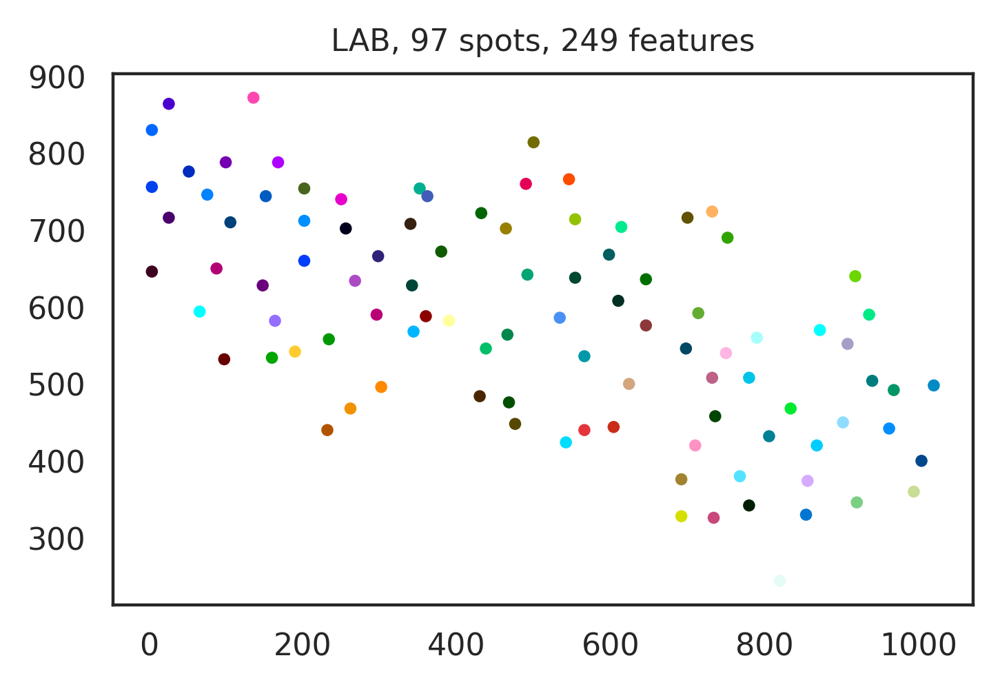

1.0 0.0


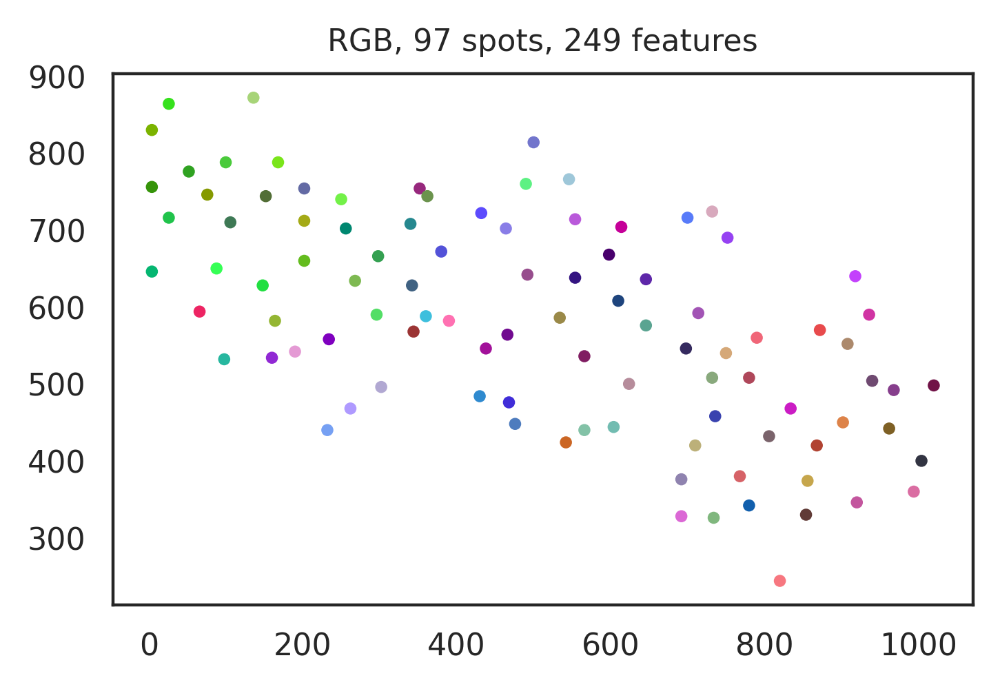

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov33/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov33/feature_dict.pickle
hippo_fov33
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov33/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov33/feature_dict.pickle
N_Unit: 97
N_Gene: 249
The new directory is created!
[[ 3.  3.  3. ...  3.  2. 22.]
 [ 3.  4.  4. ...  3.  0.  5.]
 [23.  6.  0. ...  8.  3. 12.]
 ...
 [ 0.  1.  3. ...  1.  0.  4.]
 [ 0.  0.  3. ...  2.  1.  2.]
 [ 0.  0.  1. ...  1.  1.  3.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov52/data.h5ad


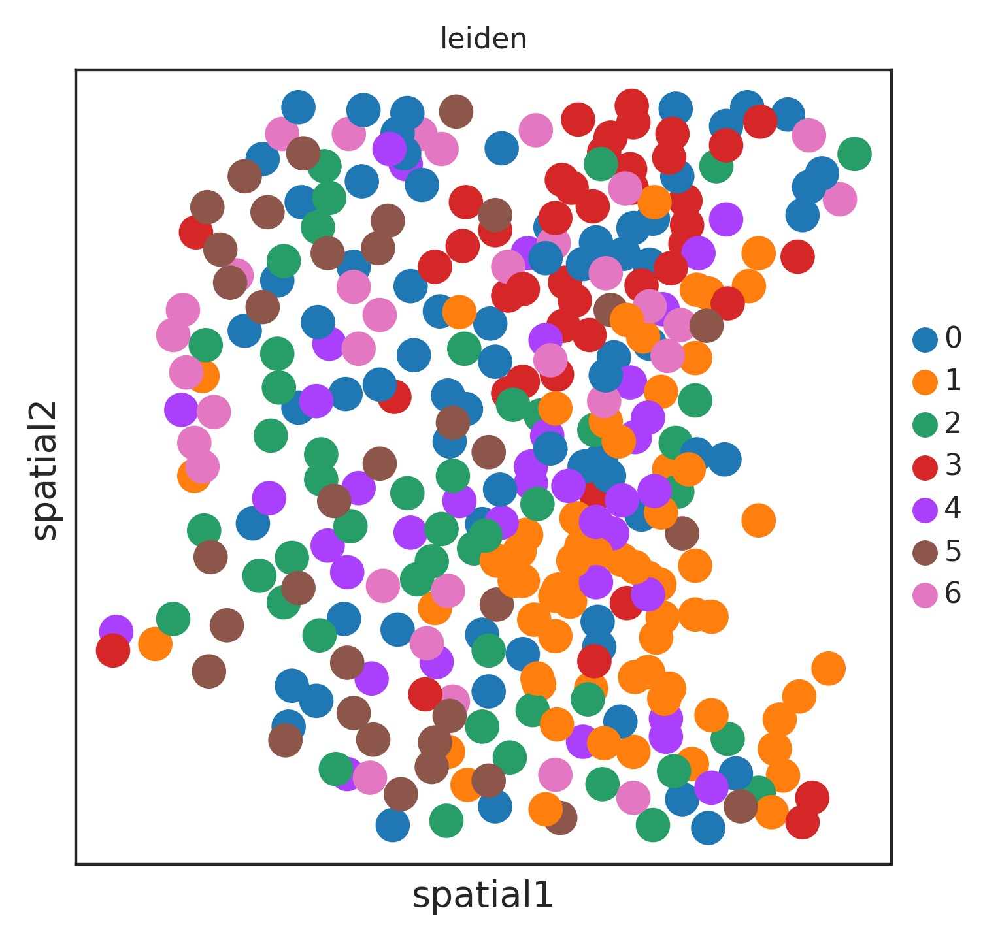

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 23 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


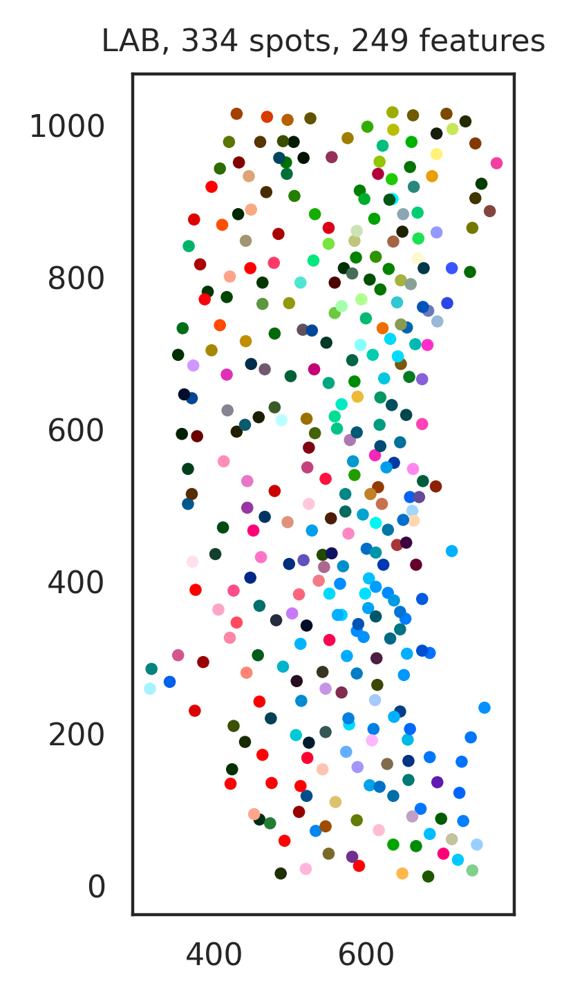

1.0 0.0


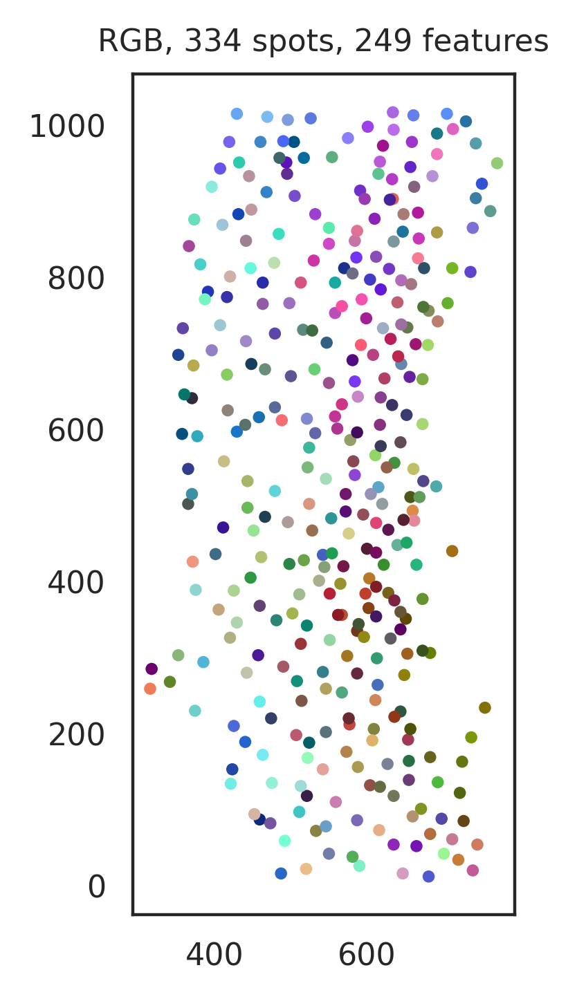

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov52/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov52/feature_dict.pickle
hippo_fov52
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov52/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov52/feature_dict.pickle
N_Unit: 334
N_Gene: 249
The new directory is created!
[[23. 13.  3. ... 43. 10. 50.]
 [ 4. 14.  7. ... 42.  3. 32.]
 [19. 30.  0. ... 39.  8. 39.]
 ...
 [ 7.  5.  2. ...  0.  0.  4.]
 [ 3.  4.  5. ... 26.  1. 32.]
 [ 5.  5.  3. ... 10.  1. 13.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov50/data.h5ad


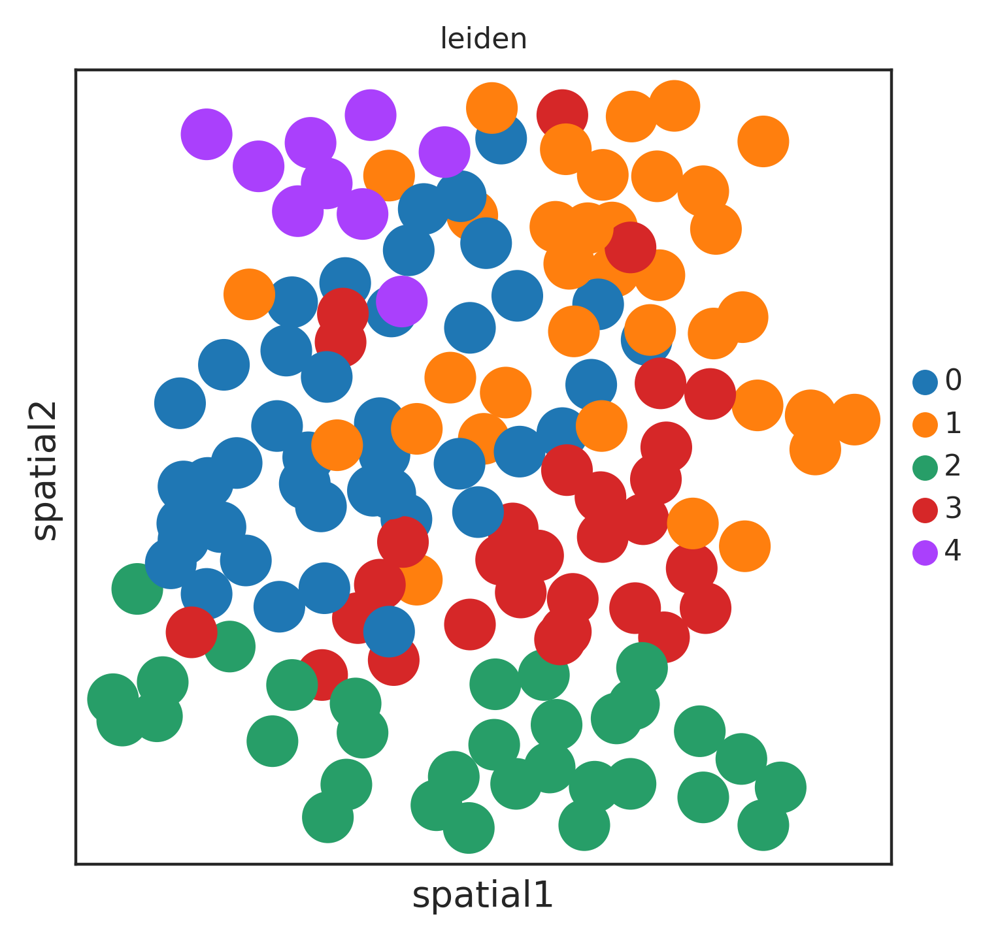

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 25 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


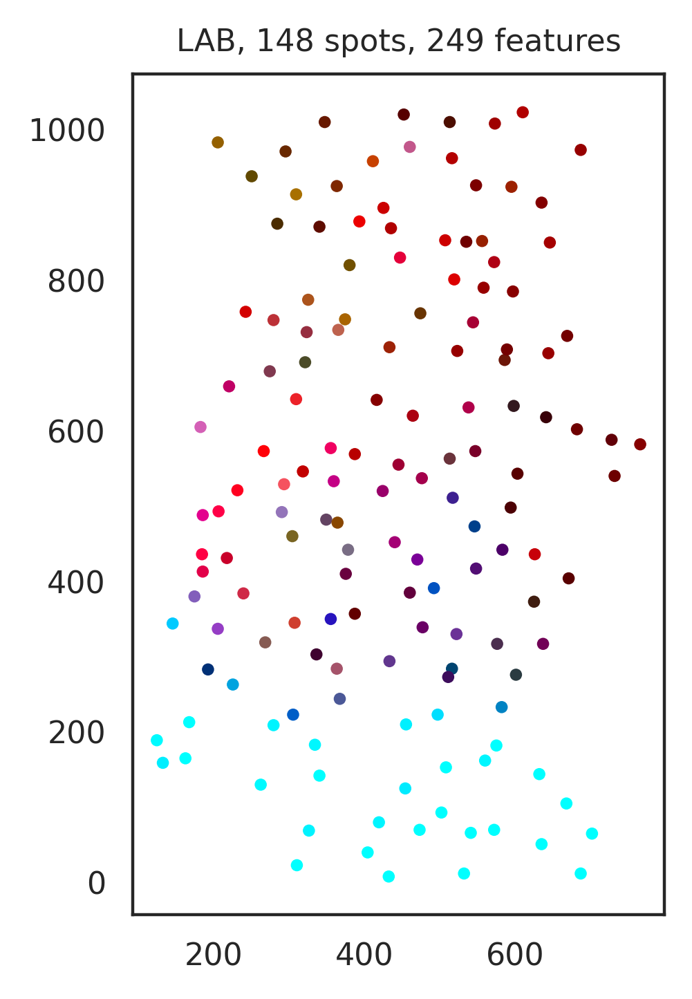

1.0 0.0


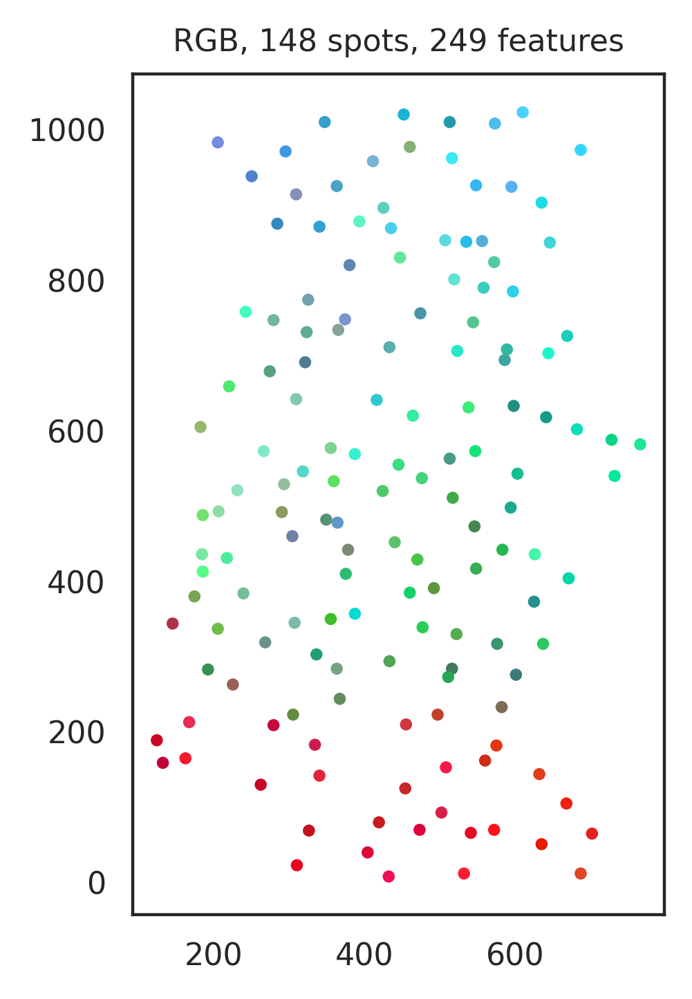

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov50/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov50/feature_dict.pickle
hippo_fov50
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov50/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov50/feature_dict.pickle
N_Unit: 148
N_Gene: 249
The new directory is created!
[[36. 12. 10. ... 23.  4. 41.]
 [11. 14.  7. ... 28.  5. 35.]
 [ 3.  4.  3. ... 34. 17. 23.]
 ...
 [16.  8.  8. ...  7.  1.  4.]
 [19.  4.  5. ... 13.  5. 15.]
 [ 5.  8.  2. ... 12.  2.  8.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov46/data.h5ad


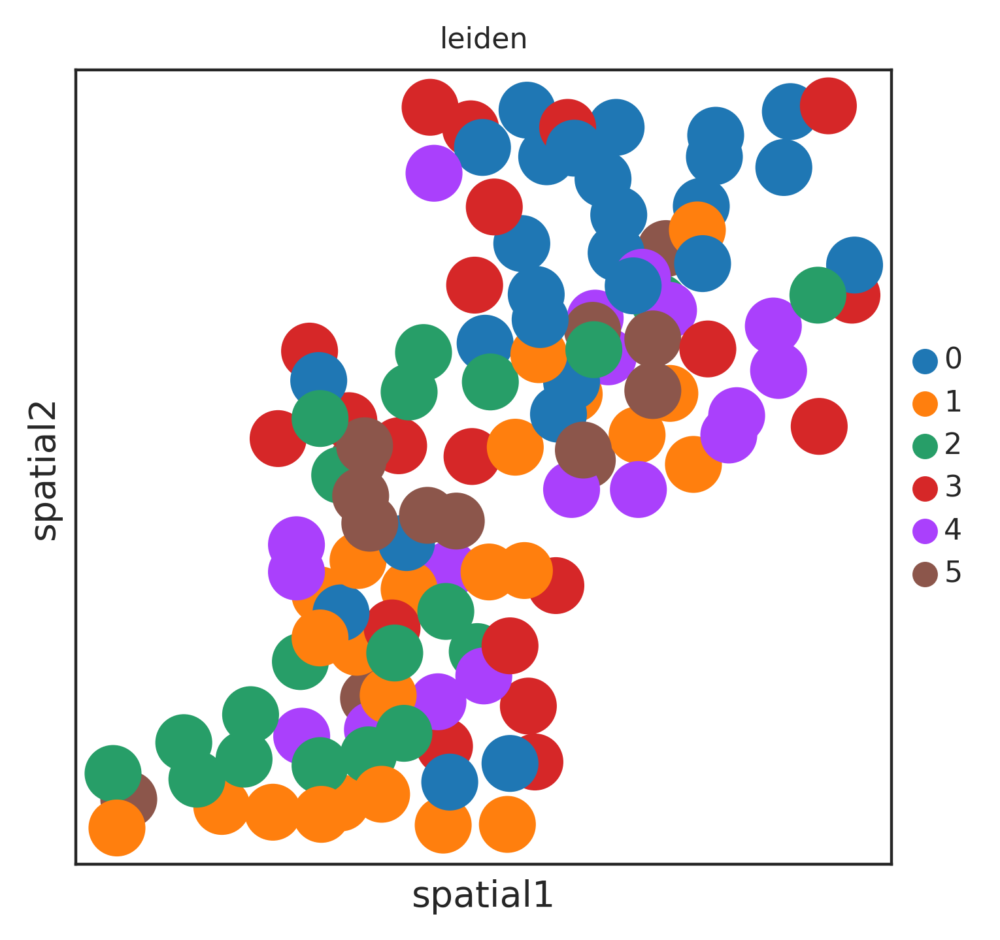

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


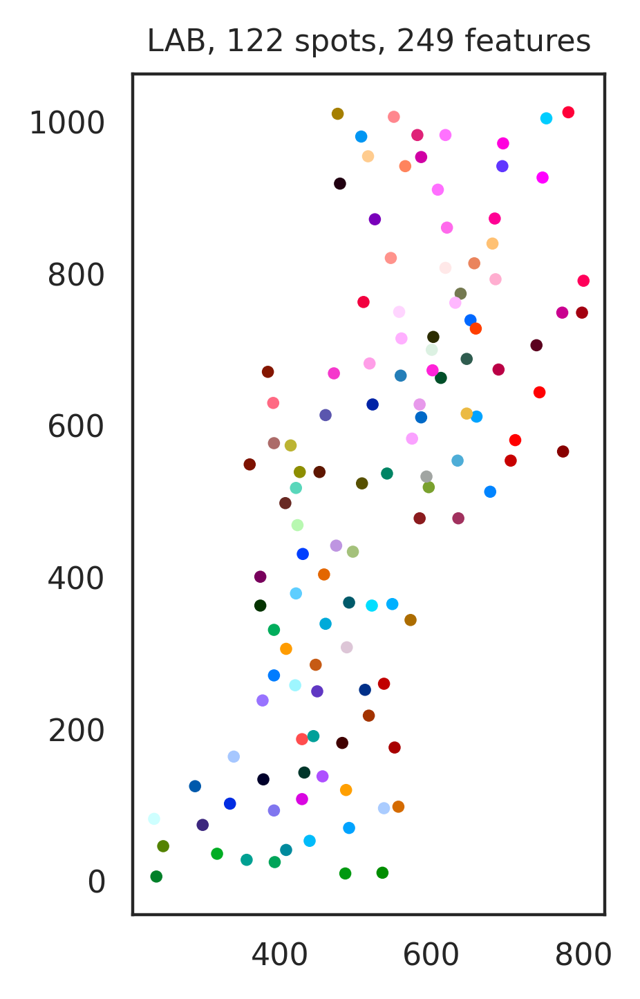

1.0 0.0


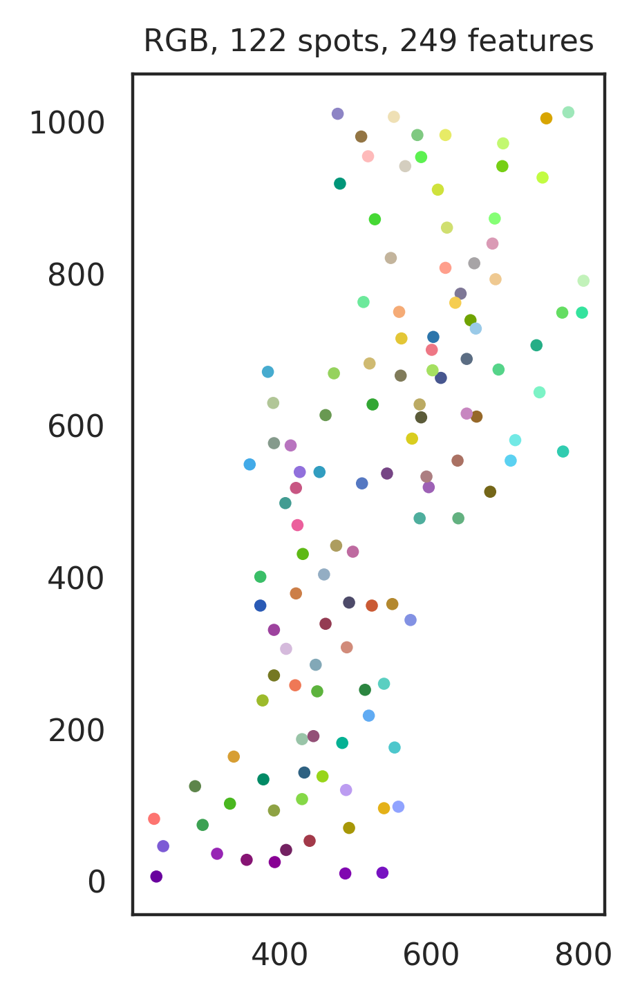

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov46/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov46/feature_dict.pickle
hippo_fov46
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov46/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov46/feature_dict.pickle
N_Unit: 122
N_Gene: 249
The new directory is created!
[[ 6.  8. 23. ... 61. 13. 19.]
 [ 8. 14. 20. ...  7.  5. 18.]
 [12. 14. 13. ... 44.  9. 38.]
 ...
 [ 1.  3. 18. ... 42. 10. 27.]
 [16. 17.  7. ...  8.  2.  2.]
 [19. 20. 27. ...  8.  6. 30.]]
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov38/data.h5ad


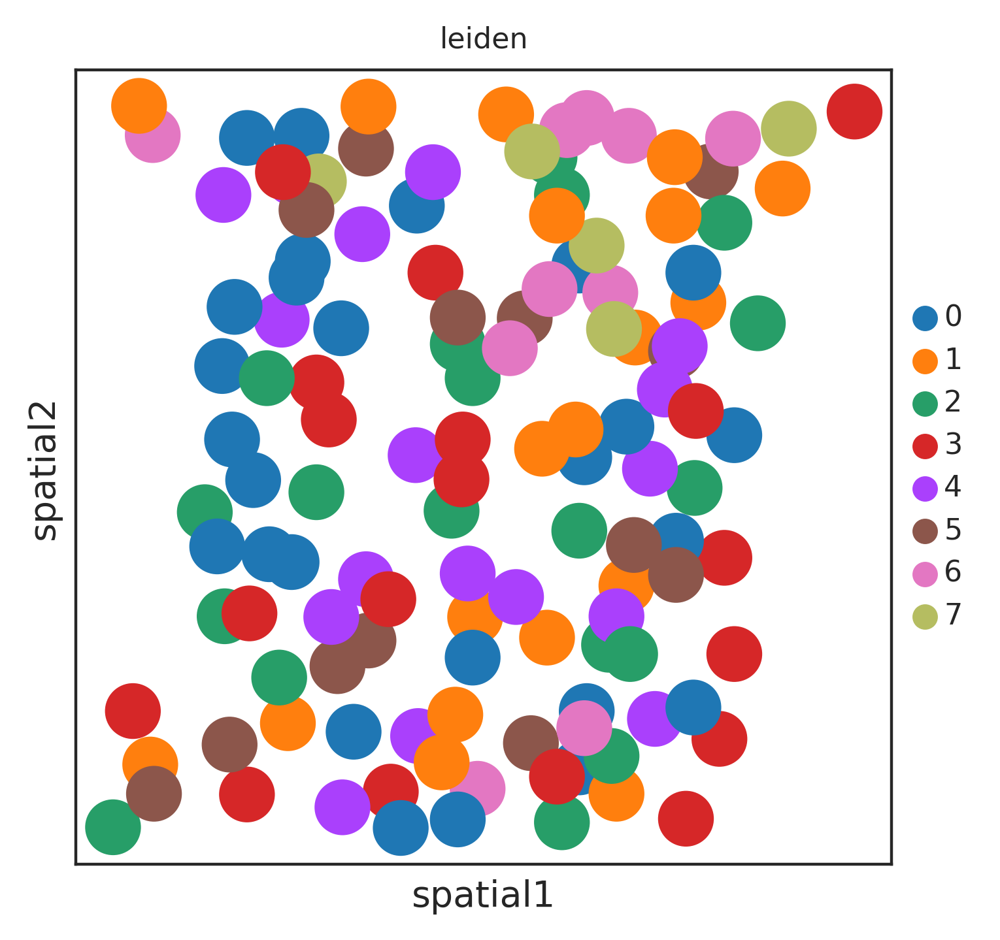

generating color coding...
1.0 0.0


/root/anaconda3/envs/SOView/lib/python3.9/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 7 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


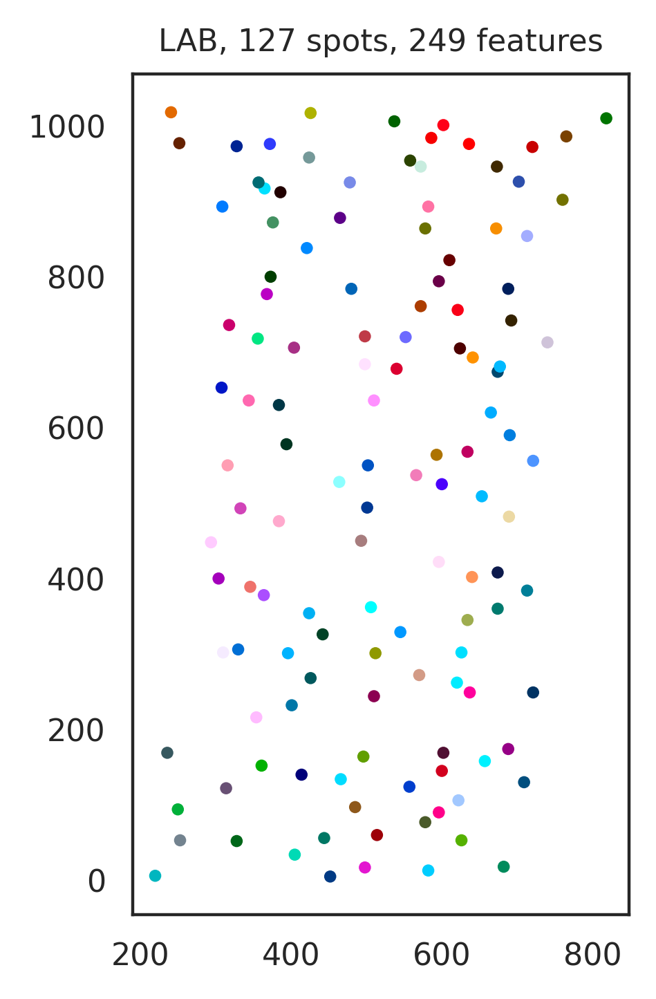

1.0 0.0


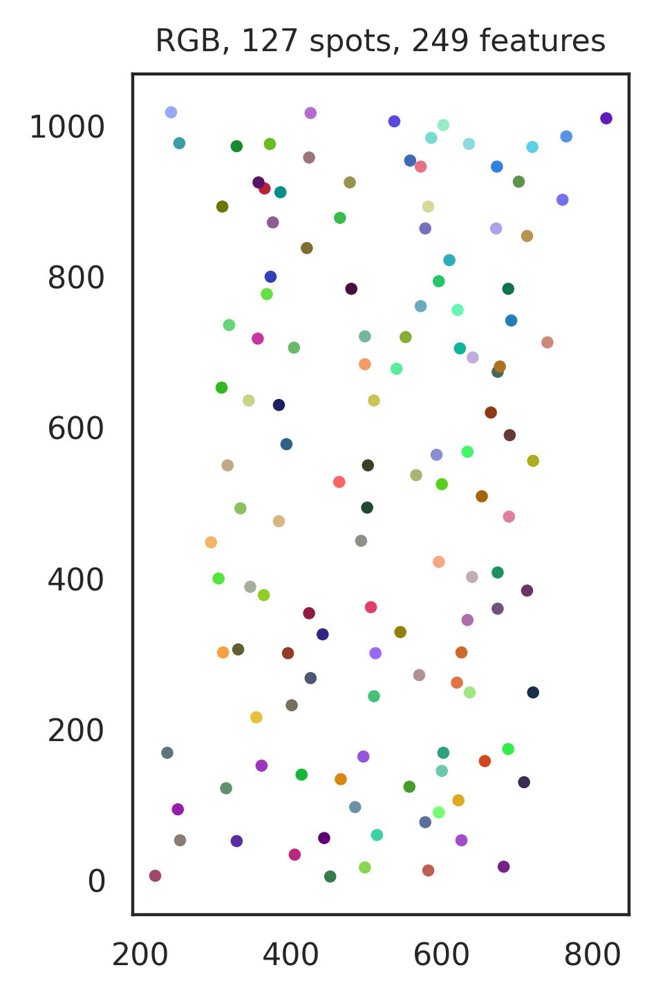

View path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov38/View_UMAP_LAB.pdf
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov38/feature_dict.pickle
hippo_fov38
h5ad path: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov38/data.h5ad
把feature_dict写为: demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov38/feature_dict.pickle
N_Unit: 127
N_Gene: 249


In [43]:
from soview import *
import shutil
import os
import gc

root_path = '/aaa/jianhuayao/project2/zhiyuanyuan/projects/SODB/'
source_h5ad_path = h5ad_path
biotech_category = 'Spatial_Transcriptomics'
biotech = 'seqFISH'
# 多个单词要加下划线
dataset_short = 'Shah2016InSitu'

h5ad_list = os.listdir(source_h5ad_path)
out_dataname_list = []
out_h5ad_path_list = []
out_feature_dict_list = []
N_Unit_list = []
N_Gene_list = []
for hl in h5ad_list:
    if not hl.endswith('.h5ad'):
        continue
    # source_h5ad_data = hl.split('.')[0]
    source_h5ad_data = hl[0:-5]


    source_h5ad = f'{source_h5ad_path}/{source_h5ad_data}.h5ad'

    data_name = source_h5ad_data
    
    import os

    path_rel = f'demo_data/{biotech_category}/{biotech}/{dataset_short}/{data_name}'
    path_abs = root_path+path_rel
    os.makedirs(path_abs, exist_ok=False)
    print("The new directory is created!")
    shutil.copyfile(source_h5ad, f'{path_abs}/data.h5ad')
    
    
    data_use = path_rel
    adata = ad.read_h5ad(f'{root_path}{data_use}/data.h5ad')
    print(adata.X)
    print(f'h5ad path: {data_use}/data.h5ad')
    
    adata.obsm['spatial'] = np.array(adata.obsm['spatial'][:,[0,1]])
    
    adata.layers["counts"] = adata.X.copy()
    
    # if np.sum(adata.X)==np.sum(adata.X.astype('int')):
    if True:
        # is all the element in adata.X are integer?
    
        sc.pp.normalize_per_cell(adata)
        sc.pp.log1p(adata)
    # if adata.shape[1]>=2000:
    #     sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
    # else:
    #     pass
    

    sc.pp.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.leiden(adata)
    
    sc.pl.embedding(adata,basis='spatial',color='leiden')
    sc.tl.umap(adata,n_components=3)
    SOViewer_plot(adata,embedding_use='X_umap',dot_size=10)
    print(f'View path: {data_use}/View_UMAP_LAB.pdf')
    
    gene_list = np.array(adata.var_names).tolist()
    obs_list = np.array(adata.obs.keys()).tolist()
    obsm_list = []
    for obsm in np.array(adata.obsm.keys()).tolist():
        for i in range(adata.obsm[obsm].shape[1]):
            cur_obsm = f'{obsm}@{i}'
            obsm_list.append(cur_obsm)
            
    feature_dict = {
        'gene':gene_list,
        'obs':obs_list,
        'obsm':obsm_list
    }
    
    import pickle
    with open(f'{root_path}{data_use}/feature_dict.pickle', 'wb') as handle:
        pickle.dump(feature_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

    print(f'把feature_dict写为: {data_use}/feature_dict.pickle')
    
    adata.write_h5ad(f'{root_path}{data_use}/data.h5ad')
    out_dataname_list.append(source_h5ad_data)
    out_h5ad_path_list.append(f'{data_use}/data.h5ad')
    out_feature_dict_list.append(f'{data_use}/feature_dict.pickle')
    N_Unit_list.append(adata.shape[0])
    N_Gene_list.append(adata.shape[1])
    
    print(source_h5ad_data)
    print(f'h5ad path: {data_use}/data.h5ad')
    print(f'把feature_dict写为: {data_use}/feature_dict.pickle')
    print(f'N_Unit: {adata.shape[0]}')
    print(f'N_Gene: {adata.shape[1]}')
    del adata
    gc.collect()

In [44]:
for i in out_dataname_list:
    print(i)

hippo_fov43
hippo_fov44
hippo_fov36
hippo_fov51
hippo_fov35
hippo_fov48
hippo_fov37
hippo_fov41
hippo_fov40
hippo_fov49
hippo_fov39
hippo_fov47
hippo_fov34
hippo_fov53
hippo_fov42
hippo_fov45
hippo_fov33
hippo_fov52
hippo_fov50
hippo_fov46
hippo_fov38


In [45]:
for i in out_h5ad_path_list:
    print(i)

demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov47/data.h5ad
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016In

In [46]:
for i in out_feature_dict_list:
    print(i)

demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov43/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov44/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov36/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov51/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov35/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov48/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov37/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov41/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov40/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov49/feature_dict.pickle
demo_data/Spatial_Transcriptomics/seqFISH/Shah2016InSitu/hippo_fov39/feature_dict.pickle
demo_data/Spatial_Tra

In [47]:
for i in N_Unit_list:
    print(i)

257
270
108
116
124
146
119
185
135
131
104
131
144
362
238
187
97
334
148
122
127


In [48]:
for i in N_Gene_list:
    print(i)

249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
249
